#**A DCGAN Project to Generate Anime Faces**
## 👉 Contributors: 👨‍💻 **Nirdesh Dwa** and 👩‍💻 **Priti Zimba** 
### 🙏 Our sincere thanks to **Sushil Thapa** and **Kshitiz Mandal**
---
### **References:**

* [Google's GAN Page](https://developers.google.com/machine-learning/gan)
* [DCGAN Tensorflow](https://www.tensorflow.org/tutorials/generative/dcgan)
* [Tricks for GANs](https://lanpartis.github.io/deep%20learning/2018/03/12/tricks-of-gans.html)
*[DCGAN for 🐱 Image Generation](https://github.com/simoninithomas/CatDCGAN)
*[DCGAN for 🐶 Image Generation](https://towardsdatascience.com/dcgans-generating-dog-images-with-tensorflow-and-keras-fb51a1071432)
*[GAN HACKS used label smooting and noise](https://mc.ai/how-to-implement-gan-hacks-to-train-stable-generative-adversarial-networks/)
*[GAN Loss Function](https://machinelearningmastery.com/generative-adversarial-network-loss-functions/)
*[Comparing Loss Functions for GAN](https://medium.com/@tayyipgoren/keras-optimizers-comparison-on-gan-b8b98c3d8645)
*[ADAM Optimizer](https://stackoverflow.com/questions/37842913/tensorflow-confusion-regarding-the-adam-optimizer)
*[Understaning Gradient Tape](https://www.pyimagesearch.com/2020/03/23/using-tensorflow-and-gradienttape-to-train-a-keras-model/)
*[Guide to GAN Failure](https://machinelearningmastery.com/practical-guide-to-gan-failure-modes/)

---




> 1. Most of the code are custom written,credit has been given to codes that are copied from other sources or modified from other sources.
2. This is our first GAN as well as Tensorflow project, so the code might not look professional , however we have tried out best to make it easy for anyone who finds the notebook easy to run the code.
3. We have also mentioned all the problems we faced during the development to make it easy for beginners.












## **IMPORTING REQUIRED LIBRARIES** 


> 1. Note: Matplotlib.imread imports png as [0-1] float while jpg as [0-255] int. It is good idea to use CV2 instead for consistency.
2. Gridspec is used in this notebook for removing the padding beween the subplots in pyplot
3. display is used to clear output in the code
4. shutil is used for working with files
5. plot_model for plotting the summary with states of a model




In [0]:
import os#working with file system
import tensorflow as tf
import numpy as np
from glob import glob #for working with files
import pickle as pkl


import cv2
import matplotlib.pyplot as plt
import shutil #for working with files
from google.colab import files #for uploading file into google drive
from google.colab import drive #for connecting with google drive
from matplotlib import image
from matplotlib import pyplot
from mpl_toolkits.axes_grid1 import ImageGrid #for showing images in grid
import time
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.compat.v1 import truncated_normal_initializer 


%matplotlib inline
import PIL
from PIL import Image
import matplotlib.gridspec as gridspec


import imageio#for displaying animation

import zipfile

import IPython
from IPython import display

##**Find GPU**
The following code helps us find GPU device name. If no GPU is available, the code will throw error message, you can neglect the message.


> Google Colab provides GPU runtime for 12 hrs per day for free users, so it's a good idea to write the code without GPU and change to GPU runtime during the training.





In [2]:
#check if GPU is being used
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


##**Connecting Google Drive** 


1.  Import drive from colab
2.  Use drive.mount('content/gdrive')  to mount the drive
3.  Click on the link provided
4.  Login to your account
5.  Copy the authorization key after logging in
6.  Paste in the input field and press enter
7.  You'll get an acknowledgement after the drive is mounted


> Mount drive in '/content/drive'

> Drive can be asccessed from the folder icon on the left or '/content/drive/My Drive'





In [3]:
drive.mount('/content/gdrive') #connect gdrive

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


##**Defining all the necessary paths**


1.   absolute_path: base path for all the folders
2.   dataset_path: the pate of the zip file downloaded from kaggle to make sure we donot redownload it if it exists.
3.   data_folder: folder where the downloaed dataset will be extracted
4.   resize_folder: folder where the extracted data will be resized and stored.
5.  sampled_folder: In case of initial tryout, it is hard to train model on all the images, this folder can be used to move few images from the main folder and train on those partial set of images
6. array_folder : Save and load raw_images.npy and scaled_images.npy so that we don't have to laod and scale data multiple times
checkpoint_folder =  project_folder + 'checkpoints/'
output_folder = project_folder + 'generated_images/'
model_folder = project_folder + 'models/'
model_summary_folder = project_folder + 'models_summary/'
discriminator_folder = model_folder+'discriminator/'
generator_folder = model_folder+'generator/'
plot_folder = model_folder+'plot/'
animation_folder = model_folder+'animation/'



In [0]:
absolute_path = '/content/gdrive/My Drive/'
project_folder = absolute_path + 'AnimeGAN/'
dataset_path = project_folder+'anime-faces.zip'
data_folder = project_folder + 'data/'
resized_folder = project_folder + 'resized_data/'
sampled_folder = project_folder + 'sampled_data/'
array_folder = project_folder + 'saved_arrays/'
checkpoint_folder =  project_folder + 'checkpoints/'
output_folder = project_folder + 'generated_images/'
model_folder = project_folder + 'models/'
model_summary_folder = project_folder + 'models_summary/'
discriminator_folder = model_folder+'discriminator/'
generator_folder = model_folder+'generator/'
plot_folder = model_folder+'plot/'
animation_folder = model_folder+'animation/'
generated_sample_folder = model_folder+'generated_sample/'

##**Defining Necessary Functions for working with Directories and Files**


1.   **create_dir()**: Helps to create directory if doesnot exist, *args:path*
2.   **move_files()**:Helps to move files from one directory to another, mighe be required in case of moving sample images
3.**is_empty()**:Helps to see if a directory exists and is empty







In [0]:
#functon to create folder in the given path if not exists
def create_dir(path):
  try:# Create target Directory if not exists
    os.mkdir(path)
    print("Directory " , path ,  " Created ")
    return True
  except FileExistsError:
    print("Directory " , path ,  " already exists")

#function to check if the directory exist and is not empty
def is_empty(path):
  if os.path.exists(path):
      print('Directory exists')
      if sum([len(files) for r, d, files in os.walk(path)]) > 0:
        print('Directory is not empty')
        return False
      else:
        print('Directoy is empty')
        return True   
  else:
    print('Directory does not exist') 
    return True



#function for moving files
def move_files(source,dest,num_of_files_to_move=None):
  if os.path.exists(dest) and sum([len(files) for r, d, files in os.walk(dest)]) > 0:
    
      print('Aborting, the destination folder is not empty')
      return
  if not os.path.exists(dest):     
    os.mkdir(dest)
    print(f'Directory created at {dest}')
  count=0
  files = os.listdir(source)
  for f in files:
    print(f'{source+f} -> {dest+f}')
    count=count+1
    shutil.move(source+f,dest)
    if num_of_files_to_move is not None:
      if (count>num_of_files_to_move): 
        break
    print(f'{count} files moved')

##**Defining Necessary Functions for working processing Images**


1.   **resize_images()**: Resize images and move to a new folder, *args:path*
2.   **normalize_images()**:Scale image pixes between [-1 to 1] if centered or between [0-255]
3.   **unnormalize_images()**:Scale image back to original pixels






In [0]:
#function for resizing files
def resize_images(source,dest,num_of_files_to_resize = None):
  if os.path.exists(dest) and sum([len(files) for r, d, files in os.walk(dest)]) > 0:
      print('Aborting, the destination folder is not empty')
      return
  if not os.path.exists(dest):     
    os.mkdir(dest)
  count = 0
  for each in os.listdir(source):
    image = cv2.imread(os.path.join(source, each))
    image = cv2.resize(image, (64, 64))
    cv2.imwrite(os.path.join(dest, each), image)
    count +=1
    if num_of_files_to_resize is not None:
      if (count>num_of_files_to_resize): #for moving 7698 files
        break
  print(f'{count} files from {source} resized and saved at {dest}')


def normalize_images(raw_images,centered=True):#scale the feature between (-1,1), images is array created above
  images = np.array(raw_images)
  if centered:
    images = (images - 127.5)/127.5
  else:
    images = images/255.0
  return images #we need it to rescale the feature back

#scale back to the actual pixel value range for the model outputs
def unnormalize_images(scaled_array,centered=True):
  if centered:
    scaled_array = (scaled_array*127.5)+127.5
  else:
    scaled_array = scaled_array*255.0
  return scaled_array.astype(np.uint8) #always convert to intvalue for imshow to display integer (can show 0-1 floa to 0-22 int not float)

##**Saving and loading arrays**

1. **load_images()**: load image files and save to array

1.   **save_array()**: save array or optionally apply a functon passed to array and save array
2.   **load_array()**:If array is found load array or create an array and save iter


In [0]:
#load images and convert to numpy array
def load_images(path):
  IMAGES = []#the array we are going to populate with image data
  for filename in os.listdir(path):
    img_data = np.asarray(Image.open(path+filename))
    IMAGES.append(img_data)
    print('> loaded %s %s' % (filename, img_data.shape))
  return IMAGES #returns array of image data


#save arrays to to load directly
def save_array(filepath,array,datafunc=None):
  if datafunc != None:
    array = datafunc(array)
  np.save(filepath, np.asarray(array))
  print(array.shape)
  return array


def load_array(path,filename, data, datafunc = None):
  if os.path.exists(path+filename):
    print('Backup file exists. Loading from the backup file.')
    return(np.load(path+filename))
  else:
    print('Backup not found. Creating array and saving to a file.')
    if not os.path.exists(path):
      os.mkdir(path)
    return(save_array(path+filename,data,datafunc)) 


##**Displaying Images**


1.   **save_array()**: save array or optionally apply a functon passed to array and save array
2.   **load_array()**:If array is found load array or create an array and save iter


In [0]:
#Displaying Images in a grid
def display_images(image_array,start_pos = 0, cols=4, rows=4,fig_size= (10., 10.),grid=222,pad=0): #show images
  # plt.clf()
  fig = plt.figure(figsize=fig_size)
  grid = ImageGrid(fig, grid,  # similar to subplot(111)
                  nrows_ncols=(rows, cols),  # creates 2x2 grid of axes
                  axes_pad=pad,  # pad between axes in inch.
                  )
  
  
  for ax, im in zip(grid, image_array[start_pos:(start_pos+rows*cols)]):
      # Iterating over the grid returns the Axes.
      ax.imshow(im)

plt.show()

In [9]:
#create the project_folder if not exists
create_dir(project_folder)

#change the working directory to project_directory
%cd /content/gdrive/My Drive/AnimeGAN/ 

Directory  /content/gdrive/My Drive/AnimeGAN/  already exists
/content/gdrive/My Drive/AnimeGAN


In [10]:
#check if data directory exists and is not empty
if os.path.exists(dataset_path) or not is_empty(data_folder) :
  print('Dataset already donwnloaded, leave the codes below commented.')
else:
  print('Download dataset by uncommenting the codes below')


Directory exists
Directoy is empty
Download dataset by uncommenting the codes below





##**Working with Kaggle in Colab with the Kaggle API for Downloading Dataset**

> Only follow this steps 1 and 2 once, also you might not need to follow steps 3 and 4 after you have downloaded the dataset once.


> You can use download API token button to download kaggle.json from your kaggle account (kaggle.com/username/account)

> If your token has expried, you'll get a message stating you are unathorized to download the dataset. You can solve this by downlading new token and replacing it in ~/kaggle/kaggle.json. Your token expires if you generate new token or click on expire my token.
[Kaggle API documentation](https://www.kaggle.com/docs/api)





1.   Install Kaggle Library to use Kaggle API
2.   Upload kaggle.json 
3.   list datasets matching a search term: kaggle datasets list -s [KEYWORD]
4.   Download dataset: kaggle datasets download -d [DATASET]
  






In [0]:
# !pip install -q kaggle  #install library to communicate with Kaggle API

In [0]:
# uploaded = files.upload() #upload kaggle.json downloaded form kaggle profile

In [0]:

# !rm  ~/.kaggle/kaggle.json
# # use if new kaggle.json is downloaded and has to be replaced




# !mkdir -p ~/.kaggle #make a .kaggle folder in root
# !cp kaggle.json ~/.kaggle/ #copy the .kaggle file uploaded to the folder
# !ls ~/.kaggle  #list the files in the .kaggle folder
# !chmod 600 /root/.kaggle/kaggle.json #change the file permisson to read write



In [0]:
# !kaggle datasets list -s anime-faces #view all the datasets from kaggle on anime-faces

In [0]:
# !kaggle datasets download -d soumikrakshit/anime-faces #download anime-faces by soumikrakshit from Kaggle 
#if you get 401-Unathourized error go to your acoount in kaggle, download new kaggle.json, and use the steps above to delete the old one and replace with new

##**Unzip Dataset**##

In [16]:
if is_empty(data_folder) :
  print('The dataset has not been extracted, uncomment the lines below run it and comment it again')
else:
  print('Leave the code below commented')

Directory exists
Directoy is empty
The dataset has not been extracted, uncomment the lines below run it and comment it again


In [0]:
# !unzip anime-faces.zip #unzip the downloaded dataset; gets unzipped to folder named data

In [18]:
#count files in data folder
print(sum([len(files) for r, d, files in os.walk(data_folder)]))


0


In [19]:
#move some data to sampled folder 
if is_empty(sampled_folder):
  move_files(data_folder,sampled_folder,1000)


Directory exists
Directory is not empty


##**Image to Array**##

In [0]:
#note if you are using the same dataset, data folder contains a data directory inside it which will 
#throw error so delete the data directory inside data directory
# shutil.rmtree('/content/gdrive/My Drive/AnimeGAN/data/data', ignore_errors=True)


In [21]:
raw_images = load_array(array_folder,'raw_images.npy',data_folder,load_images) #load images and save to array if not already loaded, else load from saved file
print(f'Dimensions of image array: {raw_images.shape}')

Backup file exists. Loading from the backup file.
Dimensions of image array: (20383, 64, 64, 3)


##**Display Images**

Dimensions of image array: (20383, 64, 64, 3)
Min value of image array: 0
Max value of image array: 255
Mean of image array: 160.7246212248974
First image value:
---------------------------------------------------------------------------------------------------
Displaying images




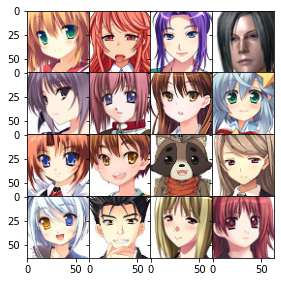

In [22]:
#visualizing image
print(f'Dimensions of image array: {raw_images.shape}')
print(f'Min value of image array: {raw_images.min()}')
print(f'Max value of image array: {raw_images.max()}')
print(f'Mean of image array: {raw_images.mean()}')
print(f'First image value:')

# print(raw_images[0])
print('---------------------------------------------------------------------------------------------------')
print(f'Displaying images\n\n')
display_images(raw_images)


##**Visualizing data**

For dataset, Min: 0,Max:255
---------------------------------------------------------------------------------------------------
Displaying plot




Text(0.5, 1.0, 'blue values  in dataset')

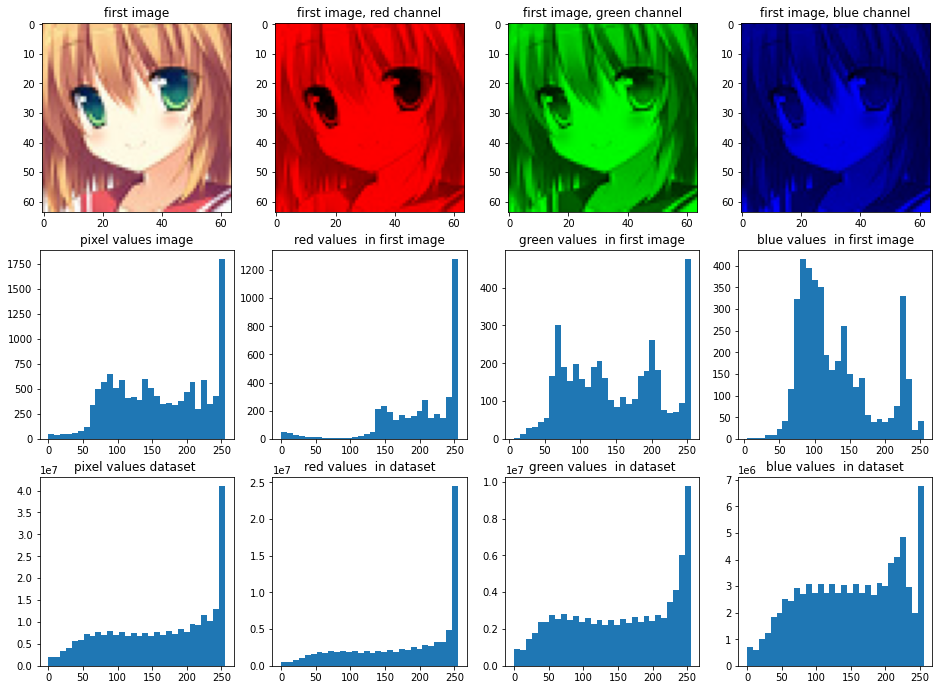

In [23]:


raw_images_all = np.reshape(raw_images,(raw_images.shape[0]*raw_images.shape[1]*raw_images.shape[2],raw_images.shape[3]))#bring all the pixel value to a single array:shape(total_images*total_pix_in_an_image,3)
# print(raw_images_all[:10])
# print(raw_images_all)
raw_images_r=raw_images_all[:,0]
raw_images_g=raw_images_all[:,1]
raw_images_b=raw_images_all[:,2]

first_image = raw_images[0]#use copy dont assign directly
min = raw_images.min()
max = raw_images.max()
print(f'For dataset, Min: {min},Max:{max}')
print('---------------------------------------------------------------------------------------------------')
print(f'Displaying plot\n\n')
fig = plt.figure(figsize = (16,16))

image_r = first_image.copy()
image_r[:,:,1]=image_r[:,:,2] = 0
image_g = first_image.copy()
image_g[:,:,0]=image_g[:,:,2] = 0
image_b = first_image.copy()
image_b[:,:,0]=image_b[:,:,1] = 0


fig1 = fig.add_subplot(4,4,1)
fig1.imshow(first_image)
fig1.set_title('first image')


fig2 = fig.add_subplot(4,4,2)
fig2.imshow(image_r)
fig2.set_title('first image, red channel')

fig3 = fig.add_subplot(4,4,3)
fig3.imshow(image_g)
fig3.set_title('first image, green channel')

fig4 = fig.add_subplot(4,4,4)
fig4.imshow(image_b)
fig4.set_title('first image, blue channel')

fig5 = fig.add_subplot(4,4,5)
fig5.hist(first_image.flatten(),bins=30)
fig5.set_title('pixel values image')

fig6 = fig.add_subplot(4,4,6)
fig6.hist(first_image[:,:,0].flatten(),bins=30)
fig6.set_title('red values  in first image')

fig7 = fig.add_subplot(4,4,7)
fig7.hist(first_image[:,:,1].flatten(),bins=30)
fig7.set_title('green values  in first image')

fig8 = fig.add_subplot(4,4,8)
fig8.hist(first_image[:,:,2].flatten(),bins=30)
fig8.set_title('blue values  in first image')

fig9 = fig.add_subplot(4,4,9)
fig9.hist(raw_images_all.flatten(),bins=30)
fig9.set_title('pixel values dataset ')

fig10 = fig.add_subplot(4,4,10)
fig10.hist(raw_images_r.flatten(),bins=30)
fig10.set_title('red values  in dataset')

fig11 = fig.add_subplot(4,4,11)
fig11.hist(raw_images_g.flatten(),bins=30)
fig11.set_title('green values  in dataset')

fig12 = fig.add_subplot(4,4,12)
fig12.hist(raw_images_b.flatten(),bins=30)
fig12.set_title('blue values  in dataset')



##**Scaling and Visualizing Data**

Backup file exists. Loading from the backup file.
---------------------------------------------------------------------------------------------------
Scaled Images
Min value after scaling: -1.0
Max value after scaling: 1.0
Mean after scaling: 0.26058526450899794
Data type: float64
---------------------------------------------------------------------------------------------------
First Image after Scaling
---------------------------------------------------------------------------------------------------
Raw Image vs Scaled Back Image to make sure they are same:

Sample unscaled pixel values image
[[238 177 125]
 [248 220 148]
 [253 228 154]
 ...
 [255 253 251]
 [246 254 248]
 [252 251 252]]

Sample scaled pixel values after scaling back
[[238 177 125]
 [248 220 148]
 [253 228 154]
 ...
 [255 253 251]
 [246 254 248]
 [252 251 252]]
---------------------------------------------------------------------------------------------------
Displaying scaled back images


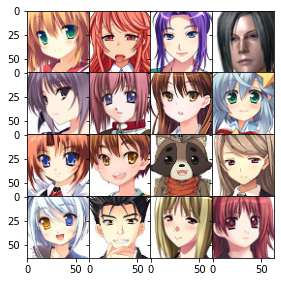

In [24]:

REAL_IMAGES = load_array(array_folder,'scaled_images.npy',raw_images,normalize_images)#load images and save to array if not already loaded and save, else load from saved file
print('---------------------------------------------------------------------------------------------------')

print(f'Scaled Images')
print(f'Min value after scaling: {REAL_IMAGES.min()}')
print(f'Max value after scaling: {REAL_IMAGES.max()}')
print(f'Mean after scaling: {REAL_IMAGES.mean()}')
print(f'Data type: {REAL_IMAGES.dtype}')

print('---------------------------------------------------------------------------------------------------')

print(f'First Image after Scaling')
# print(REAL_IMAGES[0])
print('---------------------------------------------------------------------------------------------------')

print(f'Raw Image vs Scaled Back Image to make sure they are same:\n')
raw_images_reshaped = np.reshape(raw_images[0],(64*64,3))#bring all the pixel value to a single array:shape(total_images*total_pix_in_an_image,3)
REAL_IMAGES_reshaped = np.reshape(REAL_IMAGES[0],raw_images_reshaped.shape)
print(f'Sample unscaled pixel values image')
print(raw_images_reshaped)
print(f'\nSample scaled pixel values after scaling back')
print(unnormalize_images(REAL_IMAGES_reshaped))
print('---------------------------------------------------------------------------------------------------')


print('Displaying scaled back images')
display_images(unnormalize_images(REAL_IMAGES),start_pos = 0, cols=4, rows=4,fig_size= (10., 10.),grid=222,pad=0)



##**Define required variables**

In [0]:
#from dcgan google
# Variables that determine how tensorflow will create batches after data load
BUFFER_SIZE = REAL_IMAGES.shape[0]+1
BATCH_SIZE = 32

# Weight initializers for the Generator network
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.2)

# Image dimensions, generator outputs 64x64 size image while the discriminator expects a 64x64
DIM = 64

# Variables needed for the training part
EPOCHS = 30
NOISE_DIM = 100
NUM_OF_EXAMPLES_TO_GENERATE = 16

# Noise Vector to test models
NOISE = tf.random.normal([1,100])

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([NUM_OF_EXAMPLES_TO_GENERATE, NOISE_DIM])

##**Casting float64 to float32**
>As gradient functions from Tensorflow requires floate32, so we have to type caste float64 to float32

In [0]:
#this is needed because the gradient functions from TF require float32 instead of float64
REAL_IMAGES = tf.cast(REAL_IMAGES, 'float32')

##**Creting batch and suffling the data**

In [0]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(REAL_IMAGES).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

##**Defining Models for our GAN**



> A generative adversarial network (GAN) has two parts:



1.  The generator learns to generate plausible data. The generated instances become negative training examples for the discriminator. 
2.   The discriminator learns to distinguish the generator's fake data from real data. The discriminator penalizes the generator for producing implausible results.





3. When training begins, the generator produces obviously fake data, and the discriminator quickly learns to tell that it's fake


> *All the definations are taken from [Goolge's GAN Page](https://developers.google.com/machine-learning/gan/gan_structure)*





##**GENERATOR MODEL**


> The generator part of a GAN learns to create fake data by incorporating feedback from the discriminator. It learns to make the discriminator classify its output as real.



In [0]:
#create a generator model and return it
def build_generator_model(Z=100,WEIGHT_INIT=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.2),ALPHA = 0.2,DROP_RATIO =0.3):
  #Sequential helps to create model by staking layers, use an array format or use add to add layers sequentially
  model = tf.keras.Sequential() 

  #Layer 1
  #First layer with 32,768 nodes expecting for an input of vector size 100
  model.add(layers.Dense(8*8*512,use_bias=False,input_shape=(Z,))) 
  # Normalizing activations of the previous layer for each batch
  model.add(layers.BatchNormalization())
  #apply Leaky RELU activation : f(x) = {x if x > 0 : 0.01*x}
  model.add(layers.LeakyReLU()) 
  #reshape the FC layer to (none,8,8,512) where none is batch size
  model.add(layers.Reshape((8,8,512))) 
  # check if the output shape matches the requied shape
  # assert model.output_shape == (None,8,8,512)

  #Layer 2
  #transposed convolution with 256 output_shape, (5,5) filter size, (2,2) strides,
  #the output channel depends on the  outputs shape ie 256 and the shape depends on strids ie (2,2) changes (8,8) tp (16,16)
  #Tansposed Convolution does oppostie of what Convolution layer does
  model.add(layers.Conv2DTranspose(256, (5,5), strides=(2,2), padding='same', use_bias=False,
                kernel_initializer=WEIGHT_INIT))
 
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())
  # The Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time, which helps prevent overfitting
  model.add(layers.Dropout(DROP_RATIO)) 
  # assert model.output_shape == (None,16,16,256)

  #Layer 3
  model.add(layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same', use_bias=False,
                kernel_initializer=WEIGHT_INIT))
 
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(DROP_RATIO)) 
  # assert model.output_shape == (None,32,32,128) 
 

  #Layer 4
  model.add(layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias=False,
                kernel_initializer=WEIGHT_INIT))
 
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())
  model.add(layers.Dropout(DROP_RATIO)) 
  # assert model.output_shape == (None,64,64,64) 
  #Layer 5, output Layer
  model.add(layers.Dense(3,activation='tanh', use_bias=False,
                kernel_initializer=WEIGHT_INIT))
  # assert model.output_shape == (None,64,64,3)

  return model

##**Visualizing the Generator Model**


In [29]:
#create instance of generator model
generator = build_generator_model()
#create folder to save summary if not created
create_dir(model_summary_folder)
#create png file of the summary with states and save to the designated folder
tf.keras.utils.plot_model(generator, to_file=model_summary_folder+'generator_model.png', show_shapes=True, show_layer_names=True,rankdir='TB')
# show the summary of generator model
generator.summary()

Directory  /content/gdrive/My Drive/AnimeGAN/models_summary/  already exists
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32768)             3276800   
_________________________________________________________________
batch_normalization (BatchNo (None, 32768)             131072    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32768)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 512)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 256)       3276800   
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 256)       1024      
_____________________________________________

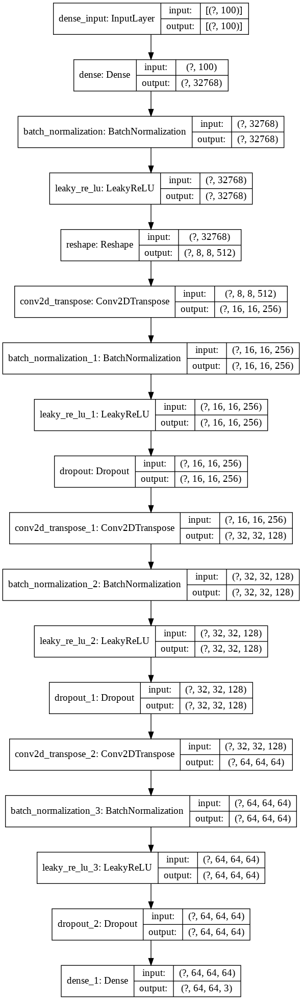

In [30]:
#plot a model graph that can make more complex models easier to understand.
display.Image(filename=model_summary_folder+'generator_model.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape of generated array: (1, 64, 64, 3)
---------------------------------------------------------------------------------------------------
Displaying Image:


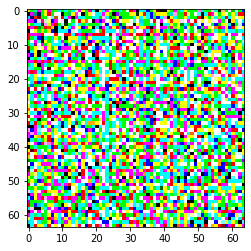

In [31]:
#pass the noise vectro to the instance to generate a fake image
generated_image = generator(NOISE, training=False)
print(f'Shape of generated array: {generated_image.shape}')
print('---------------------------------------------------------------------------------------------------')


print('Displaying Image:')
plt.imshow(generated_image[0])#don't consider the batch

##**THE DISCRIMINATOR MODEL**


> The discriminator in a GAN is simply a classifier. It tries to distinguish real data from the data created by the generator. It could use any network architecture appropriate to the type of data it's classifying.



In [0]:
#discrimination model
def build_discriminator_model(WEIGHT_INIT=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.2),ALPHA = 0.2):

  model = tf.keras.Sequential()

  #Layer 1
  model.add(layers.Conv2D(64,(4,4),strides=(2,2),padding='same',input_shape=[64,64,3],
                          kernel_initializer=WEIGHT_INIT))
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())
  # assert model.output_shape == (None,32,32,64)
  
  #Layer 2
  model.add(layers.Conv2D(128,(4,4),strides=(2,2),padding='same',
                          kernel_initializer=WEIGHT_INIT))
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())
  # assert model.output_shape == (None,16,16,128)

  #Layer 2
  model.add(layers.Conv2D(256,(4,4),strides=(2,2),padding='same',
                          kernel_initializer=WEIGHT_INIT))
  model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())
  # assert model.output_shape == (None,8,8,256)

  model.add(layers.Flatten())
  model.add(layers.Dense(1,activation="sigmoid"))

  return model


**Visualizing Discriminator Model**

In [33]:
#create instance of discriminator model
discriminator = build_discriminator_model()
#create png file of the summary with states and save to the designated folder
tf.keras.utils.plot_model(discriminator, to_file=model_summary_folder+'discriminator_model.png', show_shapes=True, show_layer_names=True,rankdir='TB')
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        3136      
_________________________________________________________________
batch_normalization_4 (Batch (None, 32, 32, 64)        256       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       131200    
_________________________________________________________________
batch_normalization_5 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 256)        

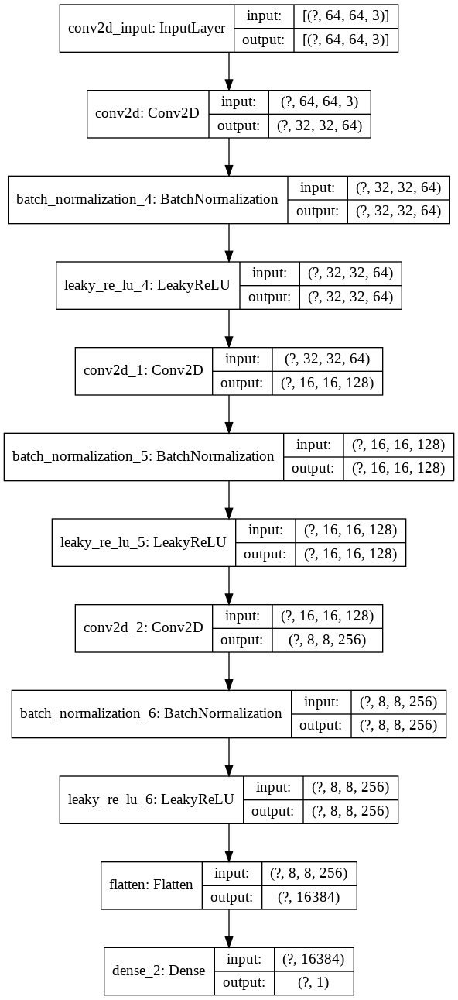

In [34]:
display.Image(filename=model_summary_folder+'discriminator_model.png')

In [35]:

decision = discriminator(generated_image)
print(decision)


tf.Tensor([[2.5169398e-12]], shape=(1, 1), dtype=float32)


##**Use Label Smoothing**
[code credit](https://mc.ai/how-to-implement-gan-hacks-to-train-stable-generative-adversarial-networks/)
>It is common to use the class label 1 to represent real images and class label 0 to represent fake images when training the discriminator model.These are called hard labels, as the label values are precise or crisp.

>It is a good practice to use soft labels, such as values slightly more or less than 1.0 or slightly more than 0.0 for real and fake images respectively, where the variation for each image is random.

>This is often referred to as label smoothing and can have a regularizing effect when training the model.

In [0]:
# Assign a random integer in range [0.7, 1.0] for positive class and and [0.0, 0.3] for negative class instead of 1/0 labels
def smooth_positive_labels(y):
    return y - 0.3 + (np.random.random(y.shape) * 0.3)

def smooth_negative_labels(y):
	return y + np.random.random(y.shape) * 0.5

##**Use Noisy Labels**

[code credit](https://mc.ai/how-to-implement-gan-hacks-to-train-stable-generative-adversarial-networks/)

> The labels used when training the discriminator model are always correct.This means that fake images are always labeled with class 0 and real images are always labeled with class 1.It is recommended to introduce some errors to these labels where some fake images are marked as real, and some real images are marked as fake.

> If you are using separate batches to update the discriminator for real and fake images, this may mean randomly adding some fake images to the batch of real images, or randomly adding some real images to the batch of fake images.

> If you are updating the discriminator with a combined batch of real and fake images, then this may involve randomly flipping the labels on some images.


In [0]:
# Changing 5% of the real images to 0 for randomly to introduce noise
def noisy_labels(y, p_flip):
	# determine the number of labels to flip
	n_select = int(p_flip * y.shape[0].value)
	# choose labels to flip
	flip_ix = choice([i for i in range(y.shape[0].value)], size=n_select)
	# invert the labels in place
	y[flip_ix] = 1 - y[flip_ix]
	return y

##**Calculating Loss**


> *We will use Cross Entropy Loss*

![alt text](https://i.ibb.co/5FFtmw9/1-rd-Bw0-E-My8-Gu3f-BOB6-GMA.png"
)


> Here 1 labeled for real images and 0 for fake image. The generator has nothing to do with last part of the equation as it has nothing to do with real images.

[
Explanation Here](https://machinelearningmastery.com/generative-adversarial-network-loss-functions/)




![alt text](https://i.ibb.co/nBP5GPN/Screen-Shot-2020-06-09-at-18-27-34.png)


>The generator and discriminator losses are different even though they derive from a single formula.




In [0]:
#returns an instance of binarycrossentropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

##**Converting Values**

* **tf.ones_like()** converts all the values in the provided tesnor to 1

* **tf.zeros_like()** converts all the values in the provided tesnor to 0 


In [0]:
#discriminator loss function
def discriminator_loss(real_output, fake_output): 
  #convert all the real output to 1 using tf.ones_like(real_output)
  #apply label smoothing to positive labels using smooth_positive_labels()
  #calulate cross entropy loss 
  real_loss = cross_entropy(smooth_positive_labels(tf.ones_like(real_output)), real_output)
  #convert all the fake output to 0 using tf.zeros_like(fake_output)
  #apply label smoothing to negative labels  using smooth_positive_labels()
  #calulate cross entropy loss 
  fake_loss = cross_entropy(smooth_negative_labels(tf.zeros_like(fake_output)), fake_output)
  #total loss is the sum of real and fake loss 
  #in the formula shown in the image above, the first part before plus accounts for fake loss and the other part for real loss
  total_loss = real_loss + fake_loss
  return total_loss

#generator loss function
def generator_loss(fake_output):
  return cross_entropy(smooth_negative_labels(tf.ones_like(fake_output)), fake_output)



**[Optimizaton of loss function](https://medium.com/@tayyipgoren/keras-optimizers-comparison-on-gan-b8b98c3d8645)** using [Adam Optimizer](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/#:~:text=Adam%20is%20an%20optimization%20algorithm,iterative%20based%20in%20training%20data.&text=The%20algorithm%20is%20called%20Adam.)

In [0]:
# Using Adam optimizer
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer =  tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

##**Save checkpoints**

Use checkpoints to save and restore models, which can be helpful in case a long running training task is interrupted.

In [0]:
#creating checkpoints to save training progress
checkpoint_dir = checkpoint_folder
checkpoint_prefix = os.path.join(checkpoint_folder, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

##**Define the training loop**
>The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

> The train step function will be called iteratviely in the function, which creates noise vectors. No of Vectors: BATCH_SIZE, Length of Vector: NOISE_DIM defined earlier.

>[Gradient Tape](https://www.pyimagesearch.com/2020/03/23/using-tensorflow-and-gradienttape-to-train-a-keras-model/) is a tensorlfow function for Automatic Differntiation.

##What is AD?

* computer has primitive operations available (e.g. addition, multiplication, logarithm)
* so every complicated function can be written as a composition of these primitive functions
* each primitive function has a simple derivative
* AD are a set of techniques using this logic of simple derivatives of composed functions Read this article

**Tensorflow "records" all the operations executed inside the context of a tf.GradientTape onto to a "tape". Using that "tape" and the gradients associated with recorded operation, tensorflow computes the gradients of a "recorded" computation using reverse mode differentiaion**


In [0]:
#from Google's DC GAN

def train_step(images,G_loss_array, D_loss_array):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      # the following are the operations recorded onto the "tape"
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      # print(f'Generator Loss: {gen_loss}')
    
      disc_loss = discriminator_loss(real_output, fake_output)
      # print(f'Discriminator Loss: {disc_loss}')
    #append loss to the loss arrays for plotting the loss 
    G_loss_array.append(gen_loss.numpy())
    D_loss_array.append(disc_loss.numpy())
    # the following lines are taking the derivatives and applying gradients using Adam optimizer
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [0]:
create_dir(model_folder)
create_dir(discriminator_folder)
create_dir(generator_folder)
create_dir(plot_folder)

Directory  /content/gdrive/My Drive/AnimeGAN/models/  already exists
Directory  /content/gdrive/My Drive/AnimeGAN/models/discriminator/  already exists
Directory  /content/gdrive/My Drive/AnimeGAN/models/generator/  already exists
Directory  /content/gdrive/My Drive/AnimeGAN/models/plot/  already exists


In [0]:
def train(dataset, epochs):
    G_loss = []
    D_loss = []

    G_batch_loss =[]
    D_batch_loss =[]
    
    for epoch in range(epochs):

        print(f'Starting epoch {epoch+1}')
        start = time.time()
        batch_count = 1
        print(f'Training batch: {batch_count} ', end = '')
        for image_batch in dataset:
            train_step(image_batch, G_loss, D_loss)
            if (batch_count % 25 == 0):
              print(f' {batch_count} ',end = '')
            if (batch_count % 325 == 0):
              print('')
            batch_count+=1
        print(f'Generator Loss: {G_loss} Discriminator Loss: {D_loss} ')
        plot_loss(G_loss, D_loss, epoch,'Iterations','Loss')
        G_batch_loss.append(np.mean(G_loss))
        D_batch_loss.append(np.mean(D_loss))
        G_loss = []
        D_loss = []
        generate_and_save_images(generator,
                                 epoch + 1,
                                 seed)
        if (epoch % 10 == 0):
            checkpoint.save(file_prefix = checkpoint_prefix)
            # display.clear_output(wait=True)
            # generate_and_save_images(generator,
            #                      epoch + 1,
            #                      seed)
            filename = generator_folder+'g_'+str(epoch+1)+'.h5'
            # generator.save(model_folder+str(epoch+1)+'.h5')
            
            #one way of saving model
            discriminator.save(discriminator_folder+'d_'+str(epoch+1)+'.h5',overwrite=True,
                include_optimizer=True)
            #trying diffent way of saving model
            tf.keras.models.save_model(
                generator,
                filename,
                overwrite=True,
                include_optimizer=True,
                save_format=None
            )
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))
        
        
            
    # Generate after the final epoch
    print("Final Epoch")
    plot_loss(G_batch_loss, D_batch_loss,None,'Epochs','Loss')
    # display.clear_output(wait=True)
    generate_and_save_images(generator,epochs,seed)

##**Generate and save images**

In [0]:
#create output folder if not exists
create_dir(output_folder)

Directory  /content/gdrive/My Drive/AnimeGAN/generated_images/  already exists


In [0]:
#modified from Google's Code
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)
  fig = plt.figure(figsize=(5,5))
  gs1 = gridspec.GridSpec(4, 4)
  gs1.update(wspace=0, hspace=0)
  # fig = plt.figure(figsize=(8,8))

  for i in range(predictions.shape[0]):
      plt.subplot(gs1[i])
      # plt.subplot(4, 4, i+1)
      plt.imshow((predictions[i, :, :, :]+1.)/2.)
      plt.axis('off')
  plt.tight_layout()
  plt.savefig(output_folder+'image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

##**Plotting Loss**

Modified from [this code](https://towardsdatascience.com/dcgans-generating-dog-images-with-tensorflow-and-keras-fb51a1071432)

In [0]:
def plot_loss(G_losses, D_losses, epoch=None,xlbl='Iterations',ylbl='Loss'):
    plt.figure(figsize=(10,5))
    if not epoch is None:
      plt.title("Generator and Discriminator Loss - EPOCH {}".format(epoch+1))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel(xlbl)
    plt.ylabel(ylbl)
    plt.legend()
    if not epoch is None:
      plt.savefig(plot_folder+'image_at_epoch_{:04d}.png'.format(epoch))
    else:
      plt.savefig(plot_folder+'final_plot.png')
    plt.show()

Starting epoch 1
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.6805769, 0.9327991, 0.69416785, 0.54910475, 1.1101801, 1.2946217, 1.2874731, 1.4510126, 1.4114577, 1.161439, 1.1321727, 1.4779811, 1.8626996, 1.5496552, 1.4891202, 1.4262904, 1.4307928, 1.4704554, 1.4514865, 1.7106886, 1.4582168, 1.5892773, 1.427746, 1.7066859, 2.0572715, 1.8436222, 1.551982, 1.8247373, 1.7455955, 1.3320796, 1.2880526, 1.6992646, 1.7790207, 1.3422964, 1.7128906, 1.8625433, 1.627452, 1.4265049, 1.5328724, 1.6002553, 1.4302496, 2.0090547, 1.9187812, 1.6705565, 1.7924582, 1.7044494, 2.0580096, 1.7652359, 1.3912778, 1.6570776, 1.6923916, 1.7272272, 1.8940108, 0.9572949, 1.6813507, 1.722407, 2.1619031, 2.1105118, 1.3481958, 1.5457265, 2.0164115, 1.8386848, 1.3070285, 1.5142279, 1.672203, 1.9526668, 1.9055182, 1.4667845, 1.4101537, 1.8614583, 1.6953243, 1.8860123, 1.5614642, 1.3737168, 1.6929902, 1.44

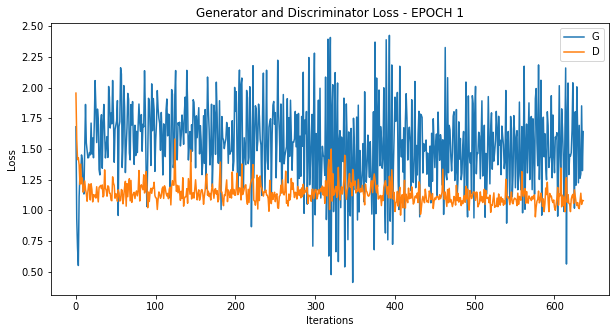

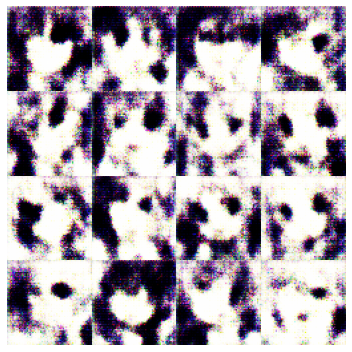

Time for epoch 1 is 188.4222493171692 sec
Starting epoch 2
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.5169885, 1.8829689, 1.9814732, 0.78404474, 1.9332001, 1.9357865, 0.5356455, 2.0043259, 1.7879611, 1.3117725, 1.5471191, 1.6908461, 1.8167539, 1.3870604, 1.811208, 1.4302503, 1.8103544, 0.99764514, 1.8094764, 1.1668407, 1.144846, 1.6641059, 1.910237, 1.338123, 1.4429734, 1.3791516, 1.6455746, 1.0899081, 1.4682531, 1.9515023, 1.8013046, 1.3139274, 1.5525707, 1.553196, 1.0358441, 1.6088982, 1.6266594, 1.9982803, 1.2483706, 1.2368548, 2.113176, 1.8040316, 1.0654595, 1.7891686, 1.3551462, 1.6519322, 1.1927996, 1.8318615, 1.8418543, 1.0602854, 1.3909147, 1.6185808, 1.4344678, 1.1935058, 1.7254584, 1.1967916, 1.4745313, 1.9798, 1.5004151, 1.2998071, 1.422414, 1.4016674, 1.4483624, 1.3511446, 1.905568, 1.6092379, 1.2086935, 1.9905096, 1.5123534, 1.1155918, 1.3268805, 1.6386917, 

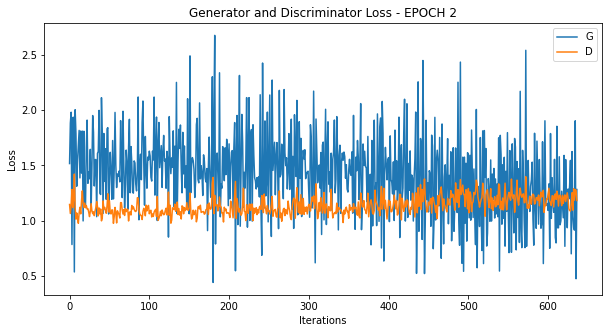

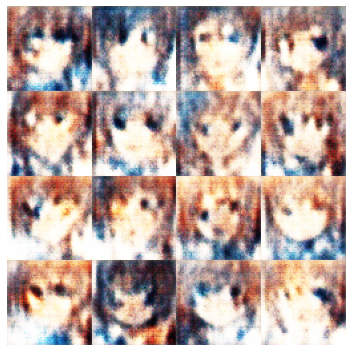

Time for epoch 2 is 184.5677297115326 sec
Starting epoch 3
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.0650707, 1.2086098, 1.640657, 0.77607584, 1.5051589, 1.2127655, 0.8707739, 1.6428843, 1.0600176, 1.2052581, 1.1855519, 1.0688994, 0.93894196, 1.0495201, 1.9961962, 0.48445448, 1.4877133, 1.4884229, 0.7294619, 1.6301641, 0.9267642, 0.91645086, 1.6482649, 0.43072733, 0.990007, 2.065208, 0.6634518, 1.0038104, 1.7450542, 0.8870084, 1.0157146, 0.8330858, 1.5812811, 0.8952923, 1.1592269, 1.238896, 0.8732976, 1.0964272, 1.0566242, 1.1233842, 0.7902056, 1.3048441, 1.3365304, 0.92608607, 1.055059, 1.3356719, 0.82536614, 1.401119, 1.0858945, 0.96082735, 1.0492852, 1.2663727, 0.8846725, 1.4373767, 0.66081464, 1.0153385, 1.7142022, 1.0588987, 0.57034373, 1.8034916, 0.6699065, 1.1114694, 1.3916025, 1.3864154, 0.7592773, 1.3531921, 0.831549, 1.4791138, 0.9303524, 0.5473432, 1.5406299,

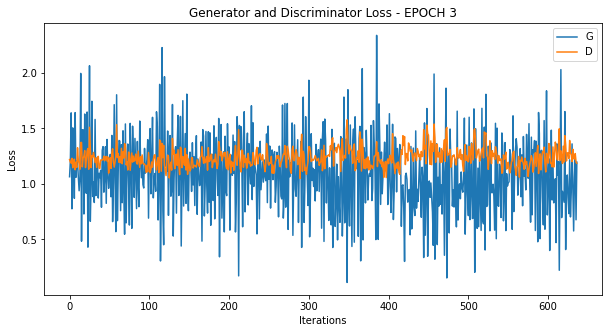

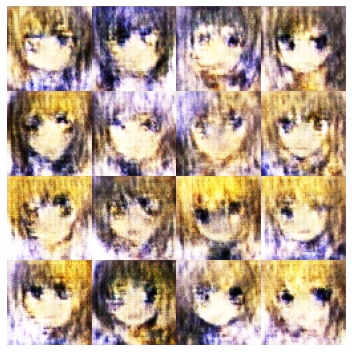

Time for epoch 3 is 183.55740356445312 sec
Starting epoch 4
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.0201209, 0.29779804, 1.2506781, 1.1887014, 0.742249, 0.85944027, 0.7407466, 0.6797271, 0.78631556, 0.7946346, 0.7888883, 1.0267231, 1.007849, 0.5961736, 0.7611987, 1.3650372, 0.39254135, 0.81477594, 1.6083708, 0.2249147, 1.4638131, 0.683162, 0.84257215, 1.2493081, 0.70635605, 1.2619334, 0.6432307, 1.3982836, 1.0156832, 0.81913155, 1.3770642, 0.26295215, 1.27306, 1.3885379, 0.54518914, 1.1562169, 1.1248553, 0.88074267, 1.0014495, 0.9006041, 0.9316428, 1.1831416, 0.83819264, 0.81194365, 1.1331515, 0.3813445, 1.4563715, 0.9383389, 0.52301276, 0.9734599, 0.5429922, 0.9729576, 1.0467479, 0.82622486, 0.899825, 1.180129, 1.3092209, 0.6995145, 0.680634, 1.1071666, 0.72505045, 1.1306319, 0.9589959, 1.0480639, 1.205368, 0.49335793, 1.3748827, 0.6569632, 0.732548, 0.8262683, 1.338

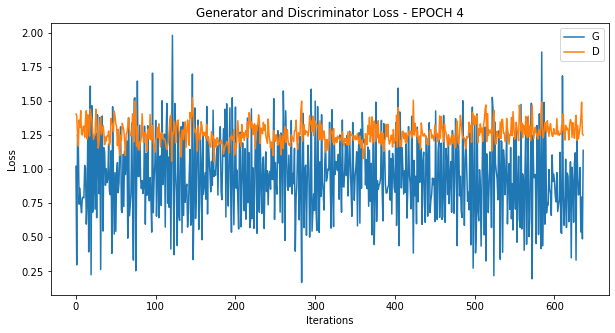

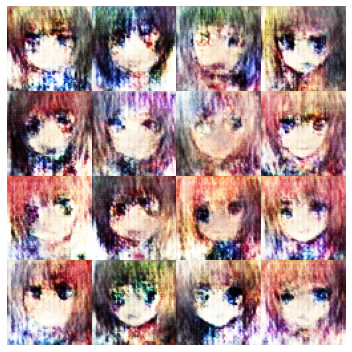

Time for epoch 4 is 185.03494834899902 sec
Starting epoch 5
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.0311208, 0.36124364, 1.2822757, 0.6209976, 0.734324, 1.126796, 0.4682323, 0.49605164, 1.1949532, 0.87980926, 0.344854, 0.9487364, 0.86765015, 0.77704465, 0.413256, 1.3620468, 0.5943853, 0.66978705, 1.2720239, 0.45344085, 0.4394299, 0.92721665, 0.8180382, 0.65005755, 0.5882646, 0.74581724, 1.0140805, 0.5063442, 1.1078498, 0.71056485, 0.5611279, 0.9055193, 0.9546113, 0.7399739, 0.71548164, 1.0909612, 0.8389017, 0.8110375, 1.3757465, 0.1524792, 0.7968852, 0.93908644, 0.98643064, 0.6017169, 0.9085571, 0.6444692, 0.6881421, 0.97860134, 0.63390434, 0.7106899, 0.979506, 0.6980448, 0.6609299, 0.9622604, 0.58777857, 1.2990384, 0.8165001, 0.96191704, 1.0802642, 0.73625076, 0.60189223, 0.9428522, 0.68790835, 1.0038247, 0.5472801, 1.1390241, 0.65075827, 0.6622435, 1.028985, 0.67343

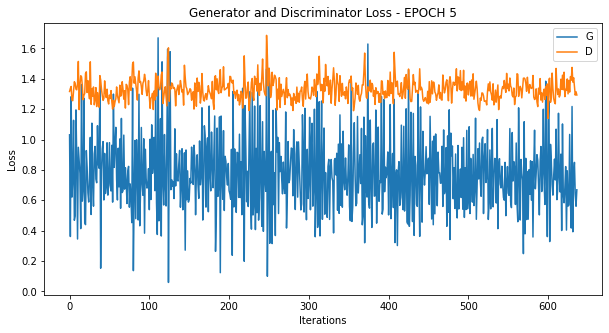

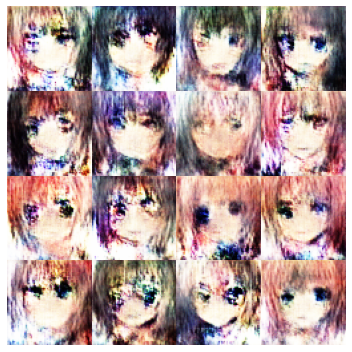

Time for epoch 5 is 184.9830870628357 sec
Starting epoch 6
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.0247842, 0.38449052, 1.0506747, 0.7469897, 0.7705459, 0.42736134, 0.9714837, 1.1434534, 0.34426385, 0.93523365, 0.75540435, 0.42791814, 1.1469629, 0.37753493, 0.6046127, 1.5060859, 0.3080366, 0.99811006, 1.0989014, 0.5507691, 0.8058493, 1.2953663, 0.3983928, 0.77043176, 0.91391534, 0.85403204, 0.65277904, 0.9921161, 1.0121679, 0.5194283, 1.0891218, 0.85070837, 0.4773848, 1.3895669, 0.61916363, 0.7995515, 1.0930948, 0.22801661, 0.82954746, 1.1108282, 0.88040113, 0.43808106, 1.104994, 1.0527592, 0.68946517, 0.65191716, 0.9489027, 0.62055767, 0.7549462, 0.7699027, 0.95432144, 0.74552745, 0.88914156, 0.8839214, 0.53285825, 0.79098535, 0.5379516, 0.8754339, 0.9265635, 0.8594352, 0.63789904, 0.539842, 1.0912378, 0.56516206, 0.41853702, 0.84397525, 0.57631004, 0.9763739, 0.6752

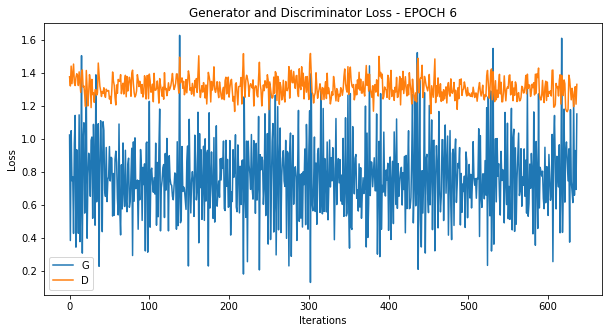

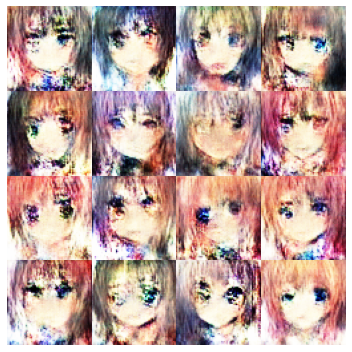

Time for epoch 6 is 184.37294220924377 sec
Starting epoch 7
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [0.37328887, 1.1690755, 0.44729674, 0.9641697, 0.49938658, 0.88474375, 0.78070337, 0.5875018, 0.7392851, 0.7940154, 0.70040554, 0.8168241, 0.6241708, 0.9362807, 1.0479472, 0.37528962, 0.82346314, 1.2655574, 0.66571164, 0.8467138, 0.6892107, 1.3246045, 0.44280416, 0.63153183, 0.8914863, 0.9507302, 0.54100645, 0.7999071, 0.575678, 0.69590336, 0.85577714, 1.0311486, 0.8632378, 0.52001345, 1.0962002, 0.9906174, 0.34565237, 0.92856395, 0.6501154, 0.6176455, 1.0978348, 0.29210058, 1.0730832, 0.70195055, 0.79838574, 0.7314819, 1.3966432, 0.24874009, 0.83636624, 1.1987734, 0.6948731, 0.8281584, 0.7579316, 0.42286116, 1.2734754, 0.5372311, 0.7443404, 1.3198777, 0.55300885, 1.301548, 0.66960377, 0.6680237, 0.82466286, 0.78078026, 0.6490382, 0.88519835, 0.607663, 0.51943743, 0.958973

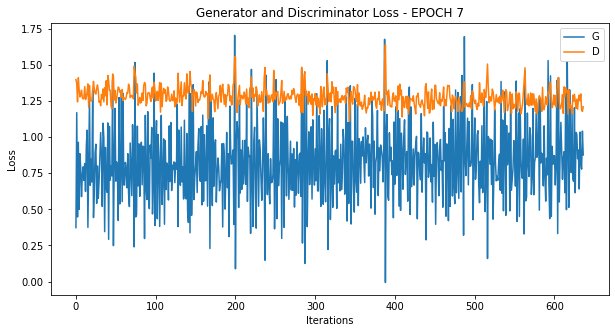

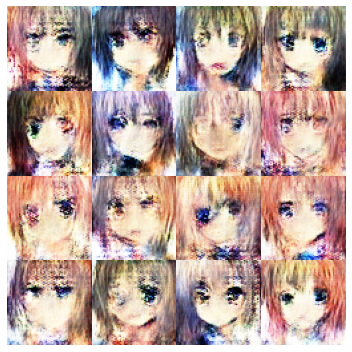

Time for epoch 7 is 184.47115063667297 sec
Starting epoch 8
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [0.9696025, 0.8542882, 0.5893851, 0.89501804, 1.0350313, 0.82415533, 0.5615655, 1.1011086, 0.9861661, 0.7159139, 1.272737, 0.8083519, 0.8054733, 1.3877764, 0.5382544, 0.8658733, 0.7757523, 0.7371026, 0.9229412, 0.7659852, 0.8692822, 1.2431474, 0.48259404, 1.0039488, 1.017751, 0.5059292, 0.7291429, 1.3513985, 0.35530755, 1.1629409, 0.90726876, 0.7253022, 0.69829667, 0.73568016, 0.46424508, 1.7094471, 0.27428135, 0.6074485, 1.1293263, 0.71505004, 0.13024741, 1.6888692, 0.71341634, 0.43354222, 1.3243375, 0.51222646, 0.5267365, 1.3561018, 0.7150016, 0.96372485, 1.279717, 0.33148295, 1.4787476, 0.6959033, 0.8671971, 1.4621875, 0.5473604, 1.1259348, 1.1726742, 0.7066863, 0.89335936, 1.3797054, 0.29844305, 1.0676328, 1.0381509, 0.8748294, 0.80176795, 1.058696, 0.84005785, 0.58133

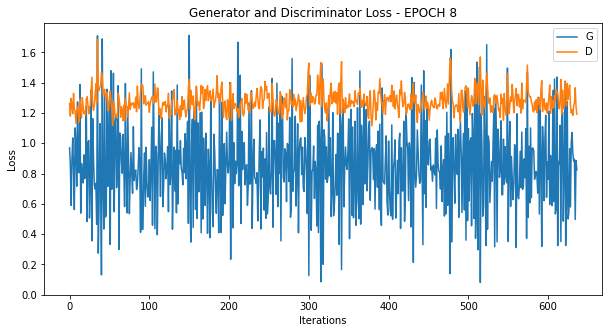

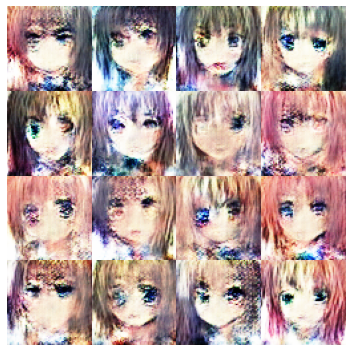

Time for epoch 8 is 185.1124403476715 sec
Starting epoch 9
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [0.84649396, 1.2446617, -0.036825497, 1.405963, 1.2837574, 0.16618794, 1.6683353, 0.9611208, 0.1879541, 1.427546, 0.7778326, 1.0723853, 0.7358507, 0.7987423, 0.79144675, 0.49529016, 0.7753848, 0.7922206, 1.112406, 0.44527012, 1.2321932, 0.72747093, 0.5307191, 0.81868494, 1.1581023, 0.27789226, 0.87206316, 1.1960161, 0.5162045, 0.9378649, 1.0424974, 0.39767364, 0.8011829, 1.3976934, 0.30888024, 0.89163685, 1.2927531, 0.50433195, 0.9065994, 1.0645795, 0.6631456, 0.84007007, 0.757527, 0.6587908, 1.1757007, 0.7572774, 0.9391171, 0.77113223, 0.94415045, 0.7854611, 0.50194806, 1.2123989, 0.60618675, 0.5228446, 1.1681918, 0.72637266, 0.4030644, 1.3501903, 0.7081934, 0.6527545, 1.093724, 0.9370378, 0.6363565, 0.7187836, 0.82376146, 0.73015904, 0.6967969, 0.7918519, 0.91730833, 0.51

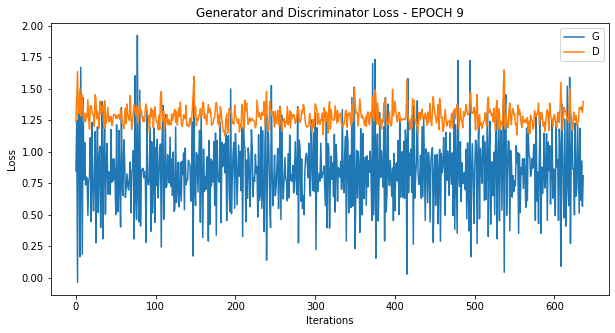

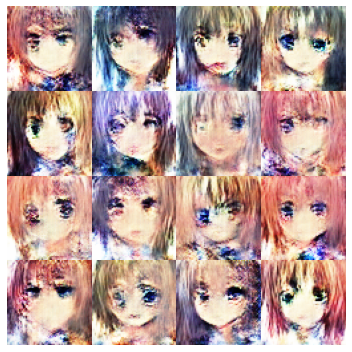

Time for epoch 9 is 184.27973747253418 sec
Starting epoch 10
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [0.5116547, 1.0153468, 0.58642685, 1.1546478, 0.38511217, 1.533138, 0.6012877, 0.65071094, 1.1817162, 0.8312056, 0.32002038, 1.2664696, 0.71426624, 0.96960676, 1.3429774, 0.24872303, 0.8846636, 1.0340133, 0.828251, 0.59939516, 1.0192378, 0.7830311, 1.1284194, 0.46893656, 0.9927516, 0.56089485, 1.0657153, 1.0273472, 1.0694896, 0.7975948, 0.6657498, 0.5168772, 1.494561, 0.6035048, 0.44925186, 1.2789695, 0.9639082, 0.85103047, 0.24545895, 1.5804769, 0.60260427, 0.619313, 1.0713983, 1.07789, 0.6589502, 0.9432932, 1.0961076, 0.9208536, 0.40945765, 1.2365382, 0.83914113, 0.6732663, 1.3065505, 0.5736706, 0.9670763, 0.94738406, 0.8025979, 0.96016407, 0.8704103, 0.36973858, 1.0328262, 0.8874695, 0.6202719, 1.2467103, 0.50205255, 1.4103565, 0.7751686, 0.81422764, 1.3471794, 0.56416

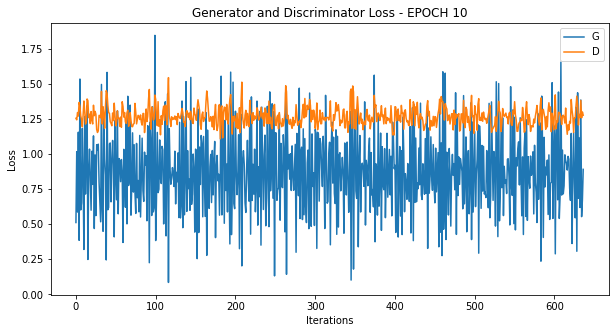

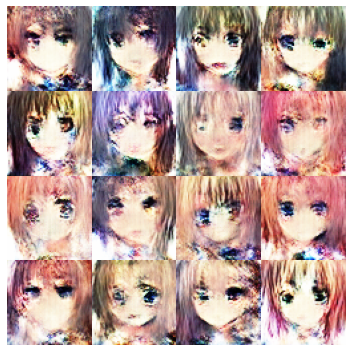

Time for epoch 10 is 184.3001368045807 sec
Starting epoch 11
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.159642, 0.7759903, 0.83025694, 1.076994, 0.6851964, 1.321254, 0.73949826, 0.6766331, 1.0395536, 1.2776964, 0.5970659, 0.9437606, 0.719826, 1.0268283, 0.8319938, 0.9312515, 0.9256912, 0.623762, 1.2818383, 0.67258257, 0.91903234, 1.365507, 0.43318158, 1.3223643, 1.0493543, 0.048889328, 1.3125094, 0.7523632, 0.50199044, 1.3923428, 0.28132746, 1.1142625, 0.8010582, 1.0772269, 0.7212131, 0.82442796, 1.0640368, 0.5664108, 1.0474359, 0.6742021, 0.97736686, 0.7151021, 1.1378045, 0.6271945, 1.1894093, 0.4097371, 1.5534585, 0.5502131, 1.0658517, 1.0898863, 0.5054834, 1.0611776, 0.8604765, 1.005127, 0.64623237, 0.9088096, 0.99432147, 0.6561218, 1.4067051, 0.56251454, 1.1457399, 0.8476726, 0.778178, 1.1533706, 0.6896767, 0.8410535, 1.5704036, 0.68756145, 0.68602335, 1.5411371, 0.6

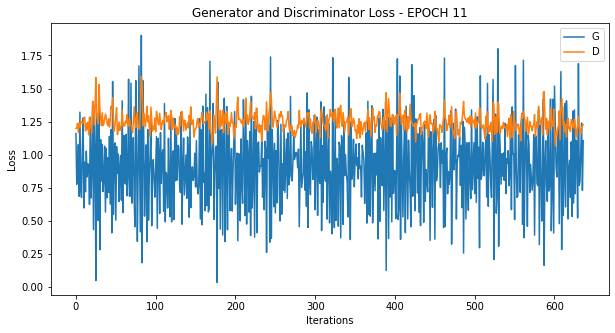

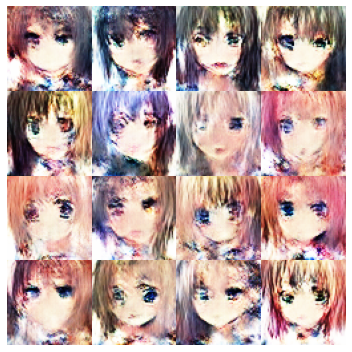

Time for epoch 11 is 185.5347375869751 sec
Starting epoch 12
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [0.73107153, 1.3892075, 0.50922453, 1.2743633, 0.73879945, 1.1974815, 0.5274644, 0.7305236, 0.8377104, 1.4627247, 0.43785018, 1.0785346, 1.2323823, 0.70996815, 0.9933429, 1.2201631, 0.62503755, 0.95795834, 1.2671176, 0.37844497, 1.318649, 0.8071499, 0.8569231, 0.8530902, 1.0431906, 0.63351876, 1.313126, 1.1164924, 0.39848715, 1.1542087, 1.1370609, 0.9837996, 0.83188236, 1.2252938, 0.57496715, 0.95663047, 1.0468256, 1.3045031, 0.25938004, 1.3879294, 0.8605664, 1.0236312, 1.0396241, 0.8855794, 1.279482, 0.48170084, 1.0248766, 1.0006407, 0.44542548, 1.600044, 0.31585023, 0.98872036, 1.2270615, 0.45218834, 1.5223997, 0.87281644, 1.0977957, 1.5885909, 0.6162157, 1.1636565, 0.7469386, 0.9797019, 0.9583077, 1.4827529, 0.8526324, 0.79043937, 1.5183897, 0.6854867, 0.83784735, 1.03

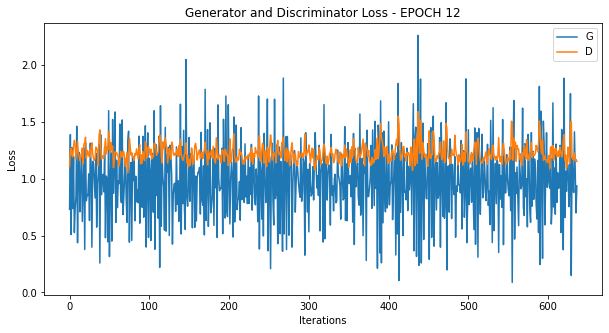

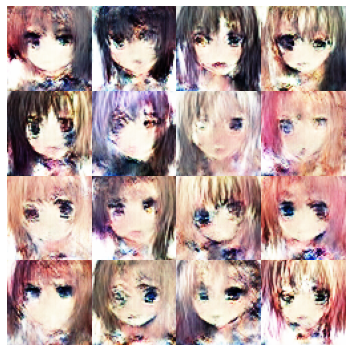

Time for epoch 12 is 181.90758609771729 sec
Starting epoch 13
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.1941757, 1.836688, 0.5656185, 0.6979855, 1.3520367, 1.1427402, 1.0726066, 0.9465964, 1.1799641, 0.7085379, 1.4185688, 0.93889713, 1.0172627, 0.9698125, 1.4709576, 0.5847841, 1.4400933, 0.9749963, 0.73844314, 1.2697475, 0.78321713, 1.1674263, 1.0272561, 1.157442, 1.1153245, 0.84516233, 0.99681634, 0.87488186, 0.6497474, 1.5873324, 1.3080297, 0.6107961, 1.1105516, 1.0910097, 0.6346022, 1.167445, 1.2279114, 1.3445045, 0.64914435, 1.3418427, 0.9668089, 1.1665727, 0.9024899, 1.3616066, 0.7483889, 0.44687238, 2.1006768, 0.42746451, 1.3669763, 0.8396541, 0.6187578, 1.5785172, 0.8322331, 0.89566827, 1.0489237, 1.514432, 0.73215806, 0.51786107, 1.9660926, 0.901846, 0.4345321, 1.2325612, 0.83648235, 0.90818346, 1.7456291, 0.7098809, 0.7254015, 1.2011791, 0.5094348, 1.482868, 1.

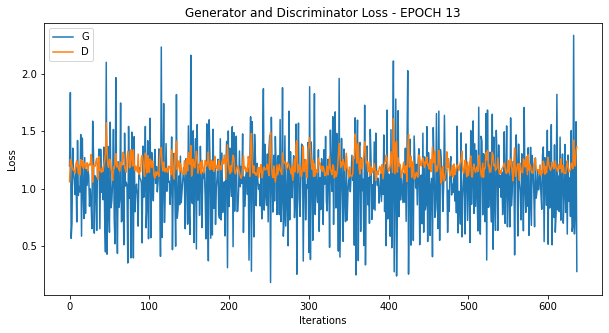

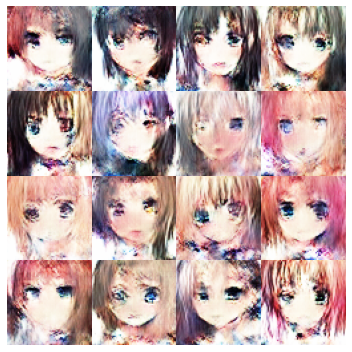

Time for epoch 13 is 181.69826316833496 sec
Starting epoch 14
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.7641551, 1.393386, 0.54892796, 1.4518034, 1.4453821, 1.2476854, 0.6850923, 1.4812462, 0.97924024, 1.334407, 1.0538605, 0.7914746, 1.3284252, 1.4374285, 0.55303246, 1.0857047, 1.554187, 0.40267146, 1.5593729, 1.3837341, 0.62911665, 1.849374, 0.46314335, 1.0882677, 1.1320093, 0.8516756, 1.1464956, 1.1085516, 1.1553968, 1.5718348, 0.46795106, 1.2696452, 1.0555301, 1.0662956, 0.63991547, 1.2427497, 1.1800561, 1.3539001, 1.3271835, 0.8180305, 2.265451, 0.3644955, 0.8200497, 1.7081218, 1.1784309, 1.1622562, 0.9022551, 0.8787183, 1.3518159, 1.0186403, 1.3368721, 0.67542475, 0.7159257, 1.1818714, 1.2963002, 1.3894815, 0.47047192, 1.8753514, 0.96165127, 0.76020384, 1.3961642, 1.0147004, 0.5655453, 2.039657, 0.57290053, 1.489691, 0.9960629, 1.3105416, 1.3206728, 0.73409224, 1.3

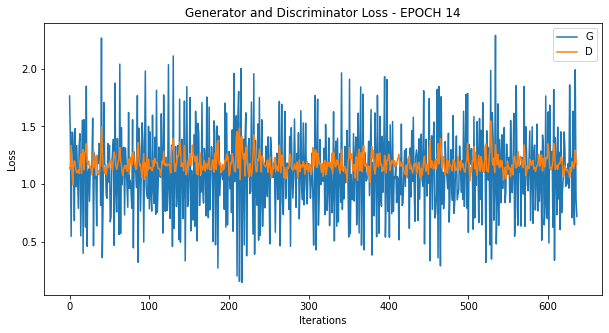

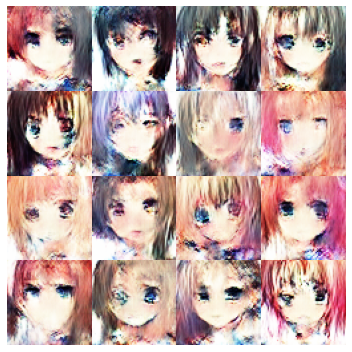

Time for epoch 14 is 182.76569318771362 sec
Starting epoch 15
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.3481365, 1.4548233, 0.867823, 1.446929, 0.5220276, 0.84036875, 2.2407928, 0.2598556, 0.7868532, 1.9239978, 0.21572578, 2.018044, 1.2647314, 0.7236992, 0.9855621, 1.652101, 1.2018667, 0.23092273, 1.686743, 0.95973396, 0.8798427, 1.433002, 1.3021684, 0.8787319, 1.328068, 1.0786611, 0.6968496, 1.7006544, 0.9981549, 1.144069, 1.0649818, 1.4585874, 0.6789535, 1.6186961, 0.56611437, 1.4723852, 1.1003145, 0.88836646, 0.8045733, 1.1489944, 1.199383, 0.6364875, 1.5259018, 1.5874372, 0.511707, 1.0846521, 1.4245573, 1.2193744, 0.90530634, 0.75442445, 1.8575118, 0.73820865, 1.0351338, 1.4588473, 0.5979788, 1.4808903, 0.6816931, 1.3923384, 1.1173118, 0.9766186, 1.4834034, 0.7716367, 1.504814, 1.2848494, 0.99638176, 1.2073061, 0.7406292, 1.300312, 0.8982836, 0.9752495, 1.2487435, 1

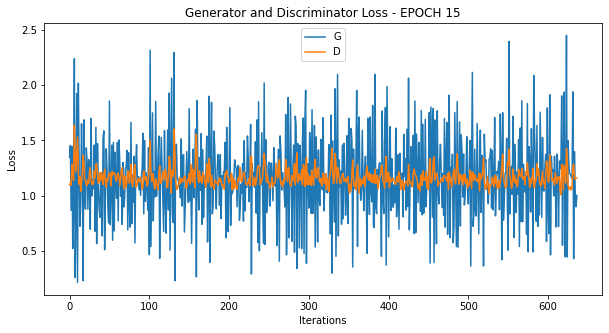

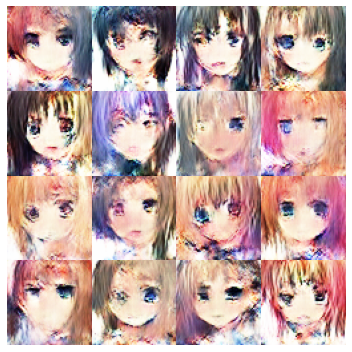

Time for epoch 15 is 182.01024651527405 sec
Starting epoch 16
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.4115195, 1.3140411, 1.4236026, 1.043983, 1.3776273, 1.2320256, 1.0728285, 1.3205308, 1.5188873, 0.5897707, 0.8634745, 1.8600712, 0.6466569, 0.950982, 2.046815, 0.95431936, 1.0614669, 1.4395361, 1.0593882, 1.2699857, 1.0296494, 1.529839, 1.7932825, 0.9429344, 1.673775, 0.6621936, 1.9923658, 1.0379062, 0.75034404, 1.5167117, 1.366157, 0.6013571, 1.7090707, 1.1235821, 0.6433766, 1.6213603, 0.94314575, 0.7869985, 1.0278404, 1.5264523, 0.8290181, 1.334806, 0.9337839, 1.3291676, 1.2777758, 0.62360203, 1.1411686, 1.812947, 0.3895286, 1.6725763, 1.1991022, 0.77618575, 1.9524469, 0.95438814, 1.1616397, 1.2432508, 1.0622132, 1.0292578, 1.432698, 0.6248543, 2.1175542, 0.5111045, 1.5786716, 1.4728085, 0.9607688, 0.93469083, 1.8912649, 1.3047367, 0.9660896, 1.2430005, 1.1657815, 1

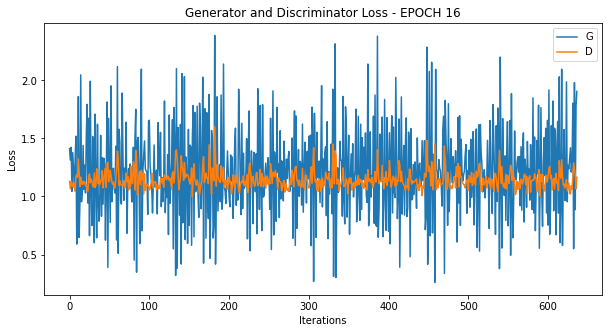

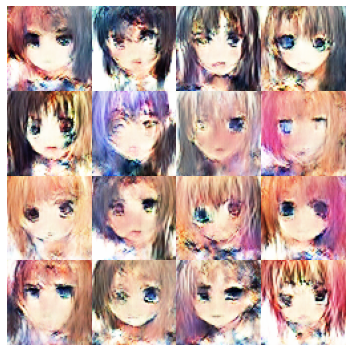

Time for epoch 16 is 183.00685334205627 sec
Starting epoch 17
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [0.75365806, 1.2512605, 1.5839754, 1.1327342, 1.1095636, 1.9619112, 1.2587664, 1.3122413, 1.404255, 0.7985806, 1.8762292, 0.6813463, 1.3869872, 1.9791073, 1.1151092, 1.129629, 1.4381506, 1.6686454, 1.1794064, 0.8571198, 1.4015176, 0.75688446, 1.6465305, 0.97924095, 1.032341, 1.0324352, 0.8730445, 1.6562645, 0.9523432, 0.810182, 1.9078549, 1.4511352, 0.35933912, 2.1984334, 0.91650736, 0.8913512, 0.81351006, 1.4796472, 0.7872535, 1.0301462, 1.7678136, 0.8917093, 1.553021, 1.456379, 1.514383, 0.9899939, 1.4299855, 1.6881355, 0.684785, 0.9838758, 1.8366013, 1.1467681, 1.1706501, 0.8963899, 1.4790326, 1.3645126, 1.2952065, 1.2744014, 1.0228792, 1.307733, 1.2809465, 1.5971897, 0.60915345, 1.5298711, 1.7749367, 0.7570445, 1.2678218, 1.2618372, 1.9006422, 1.0519384, 0.9702573, 1

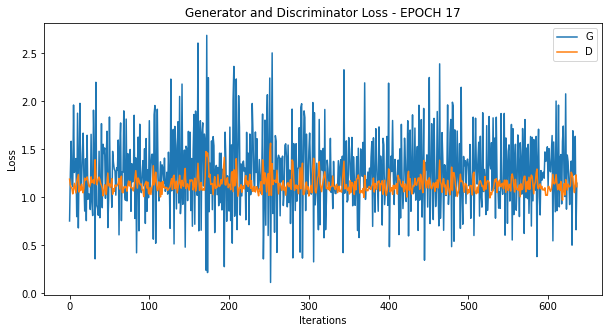

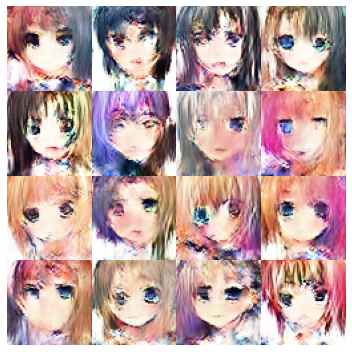

Time for epoch 17 is 184.26125979423523 sec
Starting epoch 18
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.9374139, 0.85142785, 1.4779074, 1.1752408, 1.5091442, 1.0617985, 1.0788949, 2.165339, 1.0403624, 0.49863327, 1.8307691, 0.60550994, 0.9292268, 1.4236684, 1.2476623, 1.1886638, 1.1320305, 0.8414023, 1.8500369, 0.8366016, 1.6063739, 0.6997607, 1.9147918, 0.76251066, 1.9265392, 0.3354358, 1.3115461, 1.4634707, 1.0486124, 1.2469692, 1.3546598, 1.3469012, 1.4786642, 0.68006766, 1.2288516, 1.326633, 1.2571808, 1.550369, 1.4314777, 1.1394308, 1.2219809, 1.9072696, 0.7886025, 1.8855255, 1.7267473, 0.232738, 1.5389879, 1.267337, 1.687135, 0.7779485, 1.4246706, 1.3052926, 0.8588834, 1.7038296, 0.8521457, 1.5568535, 1.4257339, 1.088694, 1.6084559, 0.99519444, 1.3326006, 1.9546691, 0.8663709, 1.4098483, 1.4163086, 0.99193037, 1.6883371, 1.2170277, 1.1051686, 1.7736639, 1.2863153,

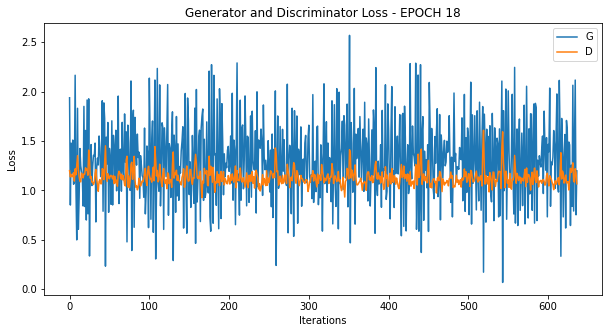

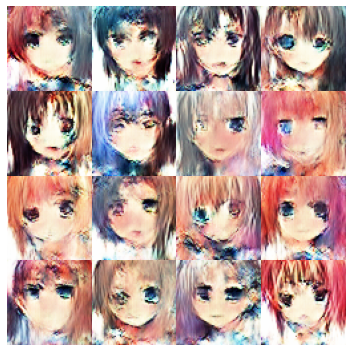

Time for epoch 18 is 184.280907869339 sec
Starting epoch 19
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.7345904, 1.1723821, 1.230951, 1.8023386, 1.0290232, 1.3624913, 1.2238823, 1.7666339, 0.9285064, 1.6319937, 0.6699407, 1.6369859, 1.4596045, 1.2687289, 1.6804163, 1.249467, 1.015603, 2.1585379, 0.33419096, 1.4910889, 1.1738825, 1.5589705, 1.3823864, 1.5530759, 0.85141015, 1.9297619, 0.9681066, 1.2001204, 1.0585394, 1.7733576, 0.87403893, 1.4427707, 1.7210859, 0.71772087, 1.1658645, 1.9042692, 1.564214, 0.40517265, 1.6389937, 1.2030292, 1.1761372, 1.9419892, 1.1833799, 1.6216004, 1.3891747, 0.9440515, 1.6827617, 0.47411034, 1.2379, 1.9771993, 0.56778634, 1.3451705, 1.4133475, 0.91669756, 1.8780112, 1.2575405, 0.9189327, 1.8800405, 1.9799453, 0.5622649, 1.5568856, 1.787261, 0.447006, 1.3349081, 2.2832026, 0.5734979, 1.1611038, 1.690974, 1.15695, 1.266787, 1.2126417, 1.6165

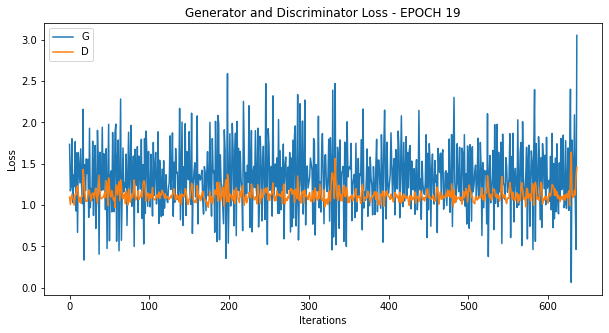

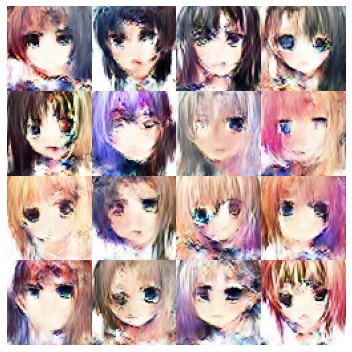

Time for epoch 19 is 185.1408269405365 sec
Starting epoch 20
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [-0.15771957, 3.427279, 0.56521225, 1.339089, 2.3584461, -0.11616109, 1.7657495, 1.7787657, 1.1026844, 1.2280596, 1.4493402, 1.1071525, 1.3707634, 1.9326539, 0.85109556, 1.7337476, 1.0789168, 1.2922754, 1.7066095, 0.89587057, 1.5833719, 0.92242116, 1.2440388, 1.3038445, 1.3771966, 1.4885588, 2.0798259, 0.7388144, 1.2706662, 1.7557222, 1.3964622, 1.048321, 1.9369338, 1.0011446, 1.5627387, 1.4804015, 0.9310123, 1.6182748, 1.2206993, 1.2302517, 1.0807264, 1.3338985, 1.6901603, 1.2801812, 1.0733092, 1.0982547, 1.9875343, 0.68253875, 1.462466, 1.0888267, 1.5822494, 1.553647, 0.44111672, 1.740804, 1.8168068, 1.0545508, 1.285538, 1.6286389, 1.2787564, 1.1886735, 0.7501175, 1.3040004, 1.6398408, 1.1666708, 1.2905247, 1.1318109, 1.6273856, 0.72762984, 1.0912921, 1.6978263, 0.32368

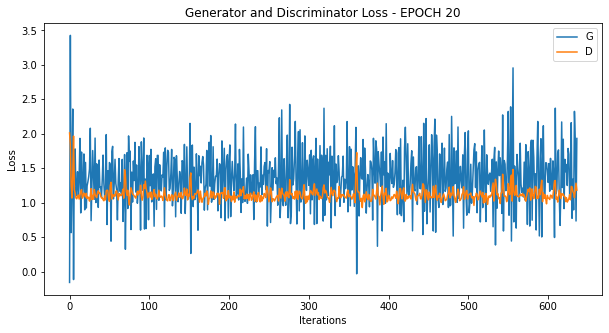

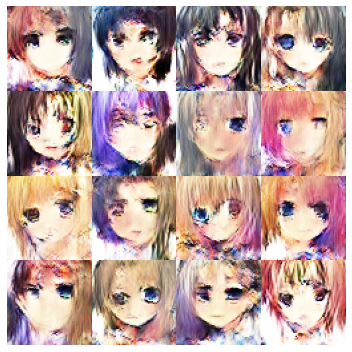

Time for epoch 20 is 184.89757990837097 sec
Starting epoch 21
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.0925832, 1.4768052, 1.4063106, 0.99711055, 1.807419, 0.58112097, 1.6617818, 1.7745724, 1.3472543, 0.75276184, 1.8676772, 1.5621319, 0.9210738, 2.0341723, 1.2303157, 0.5979976, 1.9589667, 0.71333086, 1.5588245, 1.526539, 1.4014944, 1.5159991, 1.2247239, 1.5907779, 0.7332772, 1.5684288, 1.405387, 1.717061, 1.9635413, 0.9152017, 1.2745677, 1.8600891, 1.1362348, 1.1939453, 1.6665299, 0.83986056, 1.2512223, 1.7214798, 1.516782, 0.95112574, 1.465764, 1.7384781, 0.83046305, 1.3800561, 2.0651107, 1.2606161, 1.2996094, 1.7751445, 0.73234445, 1.5819694, 1.3907148, 1.4899614, 0.8673733, 1.9192426, 1.3168991, 1.7758571, 0.70582354, 1.0630236, 1.6655321, 1.4178158, 1.6633465, 1.8542045, 0.7651431, 1.7879859, 1.3352531, 0.98636806, 1.9872124, 1.1297824, 1.4933699, 1.4798988, 1.7802

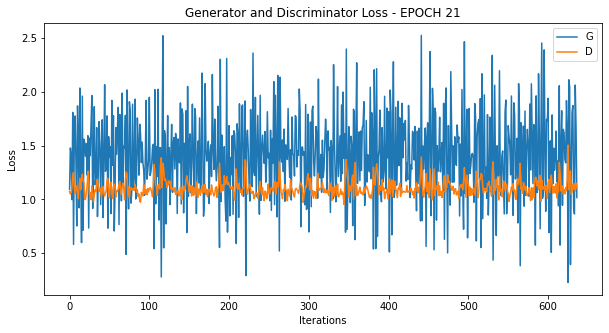

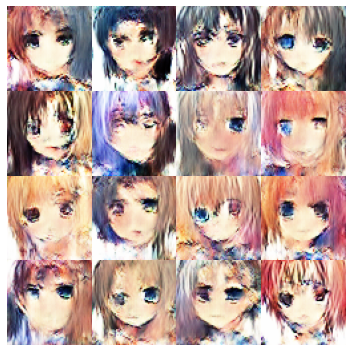

Time for epoch 21 is 186.3481731414795 sec
Starting epoch 22
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.6032233, 1.429076, 0.829075, 1.4598558, 1.1982111, 1.4196723, 1.6633155, 1.6008831, 1.1265016, 2.0846927, 1.3442693, 0.6161908, 1.9375979, 1.3986733, 0.61953604, 1.6034677, 1.2040441, 1.6289415, 1.6522527, 1.1540576, 1.7901871, 0.8813319, 1.3313668, 1.3126335, 2.1935618, 0.9509135, 1.2825453, 1.6254377, 1.1283168, 1.4178774, 1.5272518, 0.66265583, 2.234471, 1.2865939, 1.0384139, 1.2588573, 1.2131779, 1.9438984, 1.0020523, 1.83808, 1.4870398, 1.1782265, 1.4228528, 1.8894491, 1.1274672, 2.0289564, 1.5128744, 1.5761817, 1.2581723, 1.5222403, 1.1487644, 1.7149596, 1.7069905, 1.3270006, 1.3711822, 1.272227, 1.7020475, 0.7504447, 1.9825406, 1.5824721, 0.93344176, 1.6377888, 1.2540597, 1.6013975, 1.3391216, 1.4589223, 0.8908173, 2.2660563, 1.6978776, 0.68410826, 1.4928674, 1.

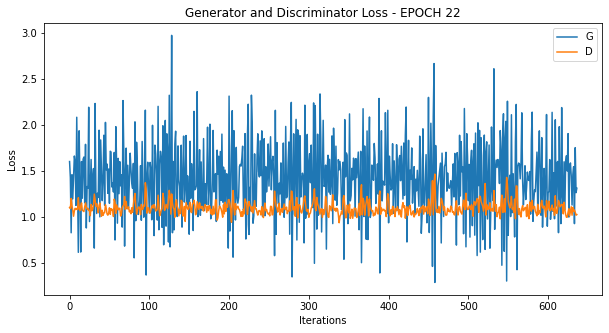

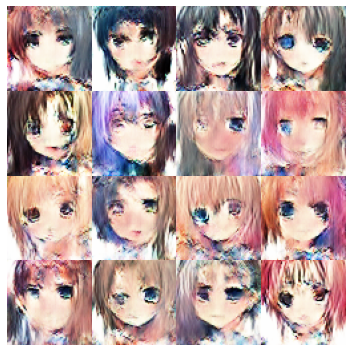

Time for epoch 22 is 185.10980224609375 sec
Starting epoch 23
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.8633653, 0.9079943, 1.642025, 1.5718155, 0.99998766, 1.9876792, 0.890154, 1.2304568, 2.0178523, 1.4424083, 1.1268177, 1.8412097, 1.0574098, 0.9640888, 1.5406816, 1.3599174, 1.2800403, 1.9990298, 1.1052296, 1.4666138, 2.5245414, 1.1024009, 1.0890934, 2.3436038, 1.0923256, 0.97007805, 2.284104, 0.8876817, 1.2987168, 1.4072142, 1.8530923, 1.2223893, 0.9912795, 1.4757934, 1.6205579, 1.7882755, 0.95393527, 1.674339, 1.4483691, 1.1019127, 1.1170911, 1.7422993, 1.5610323, 0.76272506, 1.6635133, 1.9041553, 0.8998283, 1.5920403, 1.2402409, 1.8082963, 1.7357862, 1.1551485, 1.6187941, 1.435815, 1.464853, 1.3768759, 1.6491442, 1.4417093, 1.3226371, 1.4808557, 1.5245821, 1.4434631, 1.266604, 1.5384618, 1.0865358, 1.6918917, 1.4750795, 1.5314035, 2.1617217, 1.3286662, 1.7636135, 1.

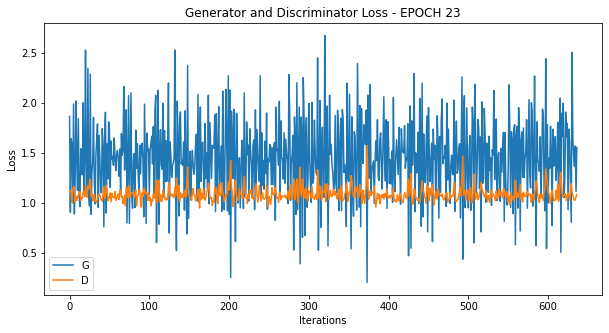

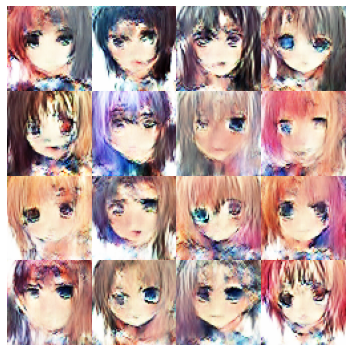

Time for epoch 23 is 184.50898265838623 sec
Starting epoch 24
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.8257498, 1.7207866, 1.8930988, 0.98891485, 1.8677642, 1.5797582, 0.45219815, 2.016811, 1.7122289, 0.98079956, 1.8086927, 0.5907315, 1.3009758, 1.5909482, 1.6128913, 0.8998871, 1.9688596, 1.657754, 1.7124066, 1.8936493, 0.7553787, 1.6430687, 2.3677535, 0.8842269, 1.3990526, 2.047492, 1.0756224, 1.7903616, 0.88297546, 2.5447, 0.8670305, 0.9963168, 2.0030181, 1.5450311, 1.0485516, 1.892677, 1.3150585, 1.5855803, 0.94940746, 1.619091, 1.4207654, 1.092641, 1.2719741, 2.1151643, 0.9512366, 0.97873724, 2.157489, 1.0247366, 1.5214777, 1.2009363, 1.6759667, 1.5497671, 1.7346495, 2.0214832, 1.7618607, 1.8550352, 1.6438404, 1.2029788, 1.6022389, 1.7529066, 1.0205569, 1.8226073, 1.0577395, 1.6628683, 0.85008305, 1.8913894, 1.7360237, 1.1708131, 1.2233247, 1.30901, 2.1391625, 0.86

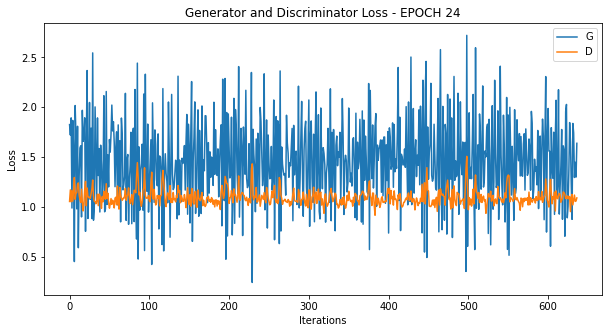

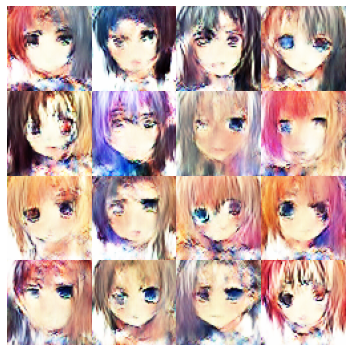

Time for epoch 24 is 184.94737672805786 sec
Starting epoch 25
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.4051466, 1.2252223, 1.2198466, 1.7402577, 1.666698, 1.5253168, 1.4039949, 1.2439454, 1.7683088, 1.5398856, 1.430114, 0.95558953, 1.9337536, 1.6643593, 1.188582, 1.3580899, 1.4568915, 1.756045, 0.77318966, 1.9938211, 1.0683012, 1.2868357, 1.8649588, 0.48743817, 1.8802326, 1.8534368, 1.3360139, 1.489469, 1.4107904, 1.4584858, 1.360316, 1.2956083, 1.7010987, 1.3953824, 1.6850396, 1.7499533, 1.3039545, 1.3436174, 1.7966974, 2.0358028, 0.6794271, 1.8358163, 1.8283023, 1.0549468, 0.8638485, 2.238035, 1.2600193, 1.3444681, 1.6229788, 1.5884855, 1.2650476, 1.3993089, 1.6290152, 1.4283135, 2.2470546, 1.0824922, 0.84740305, 2.310767, 0.61680126, 1.3765643, 1.6945283, 0.8919959, 2.2249718, 1.1009483, 1.0228937, 2.123889, 0.7427363, 1.7950128, 2.0777628, 1.1892792, 0.92190504, 2.

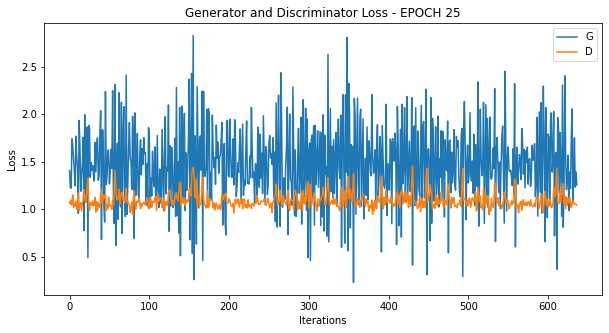

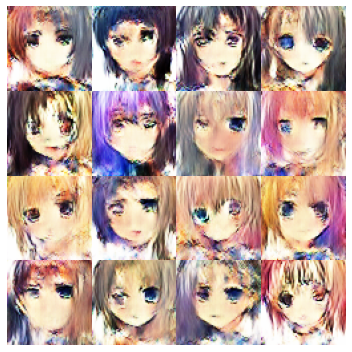

Time for epoch 25 is 184.56992411613464 sec
Starting epoch 26
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.4910684, 1.5825076, 1.5384791, 1.26778, 1.52853, 1.8673205, 1.5268791, 1.2544203, 1.2943664, 2.0763545, 1.5996796, 1.0242869, 1.8547621, 0.7737752, 1.7280235, 1.819792, 1.1280196, 1.5719408, 2.0099463, 1.3485838, 2.3327138, 0.907995, 1.5820222, 1.4235541, 1.6180388, 1.394362, 1.162794, 2.0123472, 0.4500128, 1.8641901, 1.9667412, 1.1214763, 1.295924, 1.5586984, 1.8014257, 0.8177783, 1.5621941, 2.3673303, 1.2227609, 1.3922828, 1.7765939, 1.5595338, 0.9439951, 1.7980008, 2.1177263, 1.0598942, 1.2366455, 1.405571, 2.2152765, 1.1042225, 1.2916406, 2.1088264, 0.6995939, 1.4034004, 1.659418, 1.191091, 1.5377927, 1.3037901, 1.7280707, 1.5584993, 1.3615564, 1.1950207, 1.9394954, 1.384014, 1.2850288, 1.5348954, 1.8771024, 1.4005454, 1.3045347, 1.0713992, 1.646626, 2.036151, 1.3

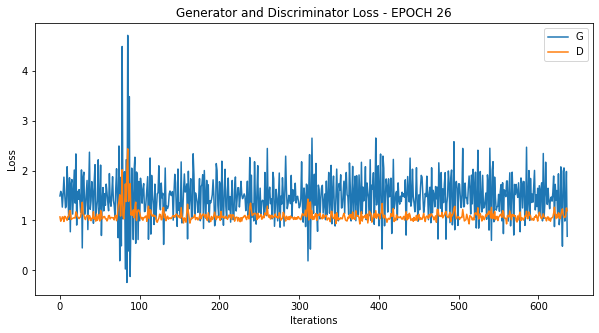

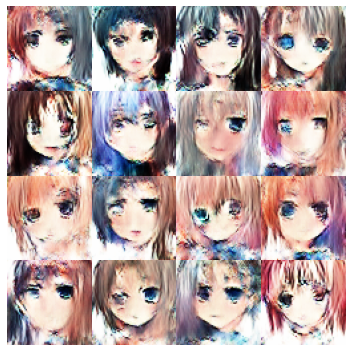

Time for epoch 26 is 184.35565829277039 sec
Starting epoch 27
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.3490925, 2.090414, 1.5012906, 1.7115673, 1.6341546, 1.6533464, 1.3945312, 1.2792288, 1.4766253, 1.9378868, 1.4709997, 1.39066, 2.3890295, 1.4361129, 1.089968, 1.6146784, 1.8438729, 1.2278385, 1.4474522, 2.2183812, 1.0767233, 1.0913272, 2.1990547, 1.4422846, 0.6885169, 1.7630134, 1.5579575, 1.2658492, 1.5662062, 1.5317019, 1.3571671, 1.3816752, 2.066889, 1.279089, 1.2017288, 1.4493933, 1.9436508, 0.9707985, 1.4576763, 1.9697813, 1.7429055, 1.0495751, 1.7168647, 1.4529665, 0.4519269, 2.2659717, 1.7712744, 1.5059189, 0.6663559, 1.4925979, 1.4741839, 0.9774958, 1.8067927, 1.8541105, 0.8016449, 1.9689958, 2.1312199, 1.0090616, 0.9652126, 1.8694587, 1.4869848, 0.6816348, 1.5755596, 2.0495753, 1.3159297, 1.1268251, 2.4111862, 1.320297, 1.3298979, 1.7929232, 1.0973184, 1.4824

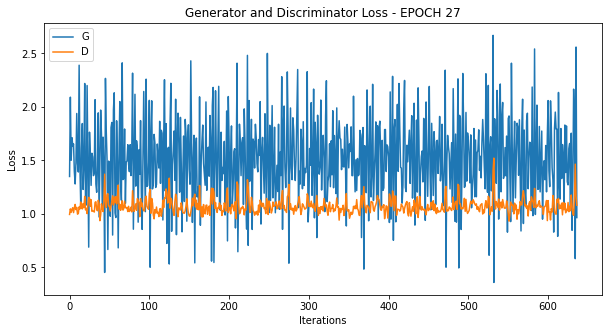

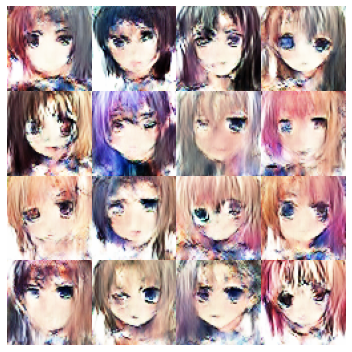

Time for epoch 27 is 184.97470498085022 sec
Starting epoch 28
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.5711405, 1.7052875, 1.6318, 0.74863243, 1.7312293, 0.94110805, 1.976396, 1.3182564, 1.3941898, 0.7449132, 1.5261562, 1.8359812, 1.3815193, 2.0111318, 1.2877083, 1.3843104, 2.0351238, 1.8722858, 0.76060414, 1.8283656, 2.0469766, 1.6491274, 1.2592851, 1.2226628, 1.8510159, 1.102953, 1.5553837, 1.6231537, 1.484572, 1.5494916, 1.2996202, 1.2834406, 1.5746225, 1.7295747, 1.0787811, 1.0631018, 2.2108083, 1.0076573, 1.2823288, 1.8149455, 1.9124718, 1.7229456, 0.67805886, 1.7953777, 2.0632412, 1.3562248, 1.4586636, 1.4291402, 1.6810313, 1.3227303, 0.6903479, 2.3203945, 1.524795, 1.1437987, 1.7347519, 1.3260114, 1.3953661, 1.6845177, 0.67144465, 1.5239071, 1.8994842, 1.2865758, 0.52560544, 2.1477866, 1.9829717, 0.59643984, 2.5849738, 1.9632026, 0.050465565, 3.1097264, 0.188632

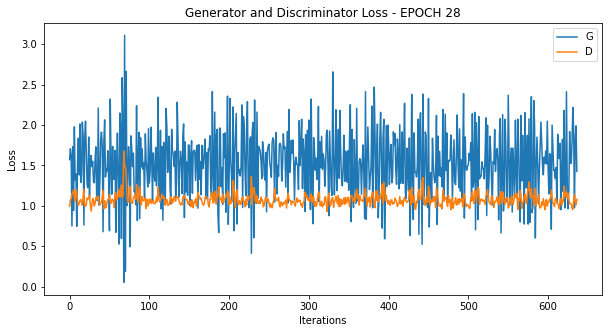

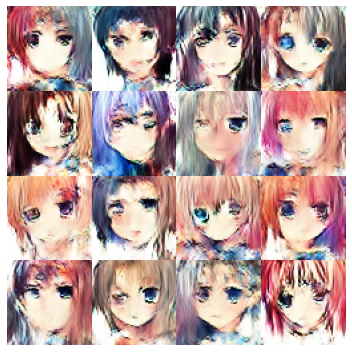

Time for epoch 28 is 184.8969647884369 sec
Starting epoch 29
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [2.009664, 0.63830245, 1.3506439, 1.7950404, 1.5465555, 1.4714416, 1.1278374, 1.2880092, 2.3782835, 1.3000011, 1.383126, 1.8374884, 1.2434698, 1.0000231, 1.6124358, 1.9912804, 1.0520425, 1.1825743, 2.0079947, 1.2987199, 0.9290036, 1.5000286, 1.7880303, 1.6134193, 1.7607119, 1.0761817, 1.5731618, 2.1239817, 1.5317681, 1.6722678, 1.2182868, 1.2185363, 1.4054388, 2.4728627, 1.643106, 1.2931759, 1.5280551, 1.4515088, 1.4427196, 1.8089973, 1.6696484, 1.3048458, 1.5004847, 1.1917912, 1.2924168, 2.1531463, 1.57167, 1.299887, 1.6256065, 1.913735, 1.5026772, 1.0237637, 1.209851, 2.3084364, 1.0512516, 1.3975989, 2.0018067, 1.7455783, 1.4352463, 1.111064, 1.9188251, 1.4671807, 1.0112772, 1.471959, 1.6952959, 2.5069895, 0.8112782, 1.3732774, 1.7433965, 0.5722099, 2.171946, 1.5157526,

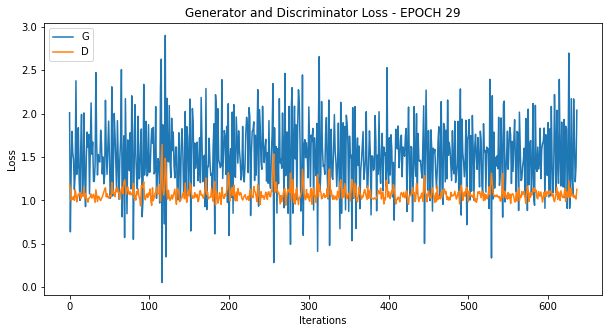

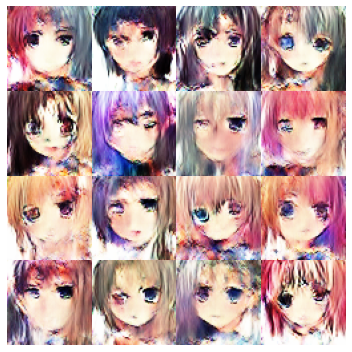

Time for epoch 29 is 184.93483996391296 sec
Starting epoch 30
Training batch: 1  25  50  75  100  125  150  175  200  225  250  275  300  325 
 350  375  400  425  450  475  500  525  550  575  600  625 Generator Loss: [1.2859292, 1.4808471, 1.1586508, 2.002338, 1.6105263, 1.8747962, 1.1495008, 1.5779216, 1.5307428, 1.7759666, 1.2755315, 1.8188457, 1.1202066, 1.8896556, 1.7885544, 1.3342547, 1.5584334, 1.6051338, 1.3756051, 1.4871883, 0.8608315, 2.313036, 1.8976583, 0.95706654, 1.998549, 1.5224146, 1.7039906, 0.4349676, 2.3911238, 1.0199916, 1.4919382, 1.7049611, 1.268754, 0.8632847, 2.5261245, 0.7938864, 1.0571399, 2.5734396, 1.1984518, 1.0645118, 1.8470061, 1.5498573, 1.1126046, 1.8391588, 1.751153, 0.9191035, 1.5772169, 2.3577712, 0.8527892, 1.481497, 1.8591759, 0.65116775, 1.7014767, 2.4586468, 2.0963924, 0.45491245, 1.9408071, 3.0195243, 0.3008844, 2.630168, 0.7658423, 1.6312929, 0.80142033, 1.7672025, 1.8039029, 1.1917866, 1.779403, 1.4138649, 1.1640404, 1.7873768, 1.777468, 1.22

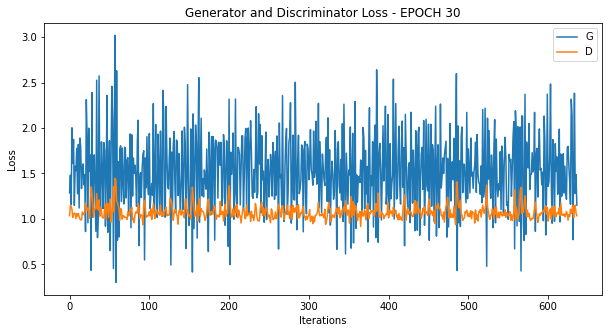

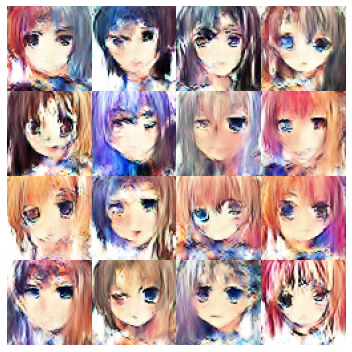

Time for epoch 30 is 184.8113293647766 sec
Final Epoch


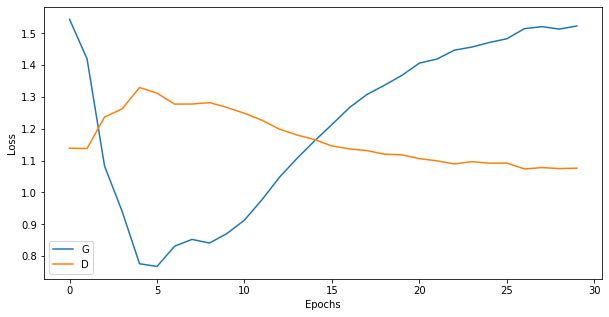

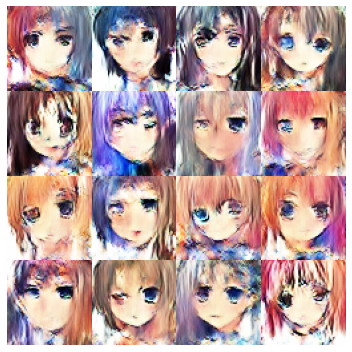

In [0]:
# %%time
train(train_dataset, EPOCHS)

##**Load Checkpoint**

In [0]:
# checkpoint.restore(tf.train.latest_checkpoint(checkpoint_folder))

##**Save Model**

In [0]:
filename = model_folder+'final_generator_model.h5'
tf.keras.models.save_model(
    generator,
    filename,
    overwrite=True,
    include_optimizer=True,
    save_format=None
)



##**Generate and Save images images to a zip file**

In [0]:
create_dir(generated_sample_folder)

In [0]:
def generate_and_save_images(filename='generated_images.zip',path='./',count=1000):
  z = zipfile.PyZipFile(path+filename, mode='w')
  for k in range(count):
      generated_image = generator(tf.random.normal([1, NOISE_DIM]), training=False)
      f = path+str(k)+'.png'
      img = ((generated_image[0,:,:,:]+1.)/2.).numpy()
      tf.keras.preprocessing.image.save_img(
          f,
          img,
          scale=True
      )
      z.write(f); os.remove(f)
  z.close()

In [0]:
generate_and_save_images('generated_images.zip',generated_sample_folder,1000)

##**View image from any epoch**

In [0]:
# Display a single image using the epoch number
def display_image(path,epoch_no):
  return PIL.Image.open(path+'image_at_epoch_{:04d}.png'.format(epoch_no))

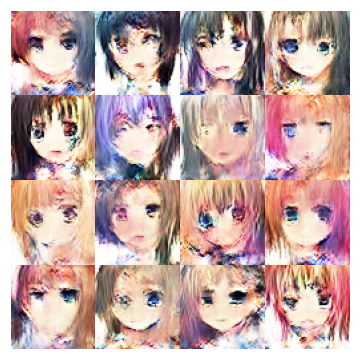

In [0]:
display_image(output_folder,15)

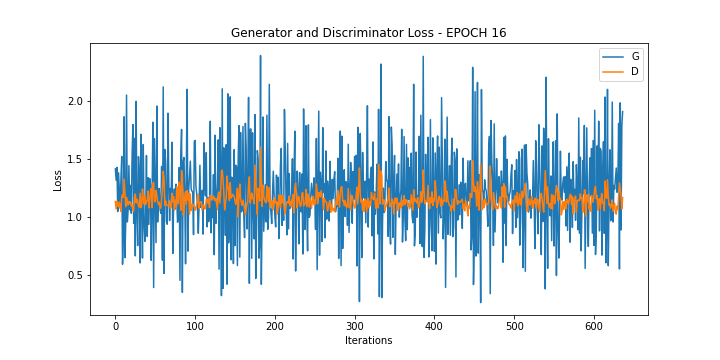

In [0]:
display_image(plot_folder,15)

##**Use imageio to create an animated gif using the images saved during training.**

In [0]:
image_anim_name = 'image_anim.gif'
plot_anim_name = 'plot_anim.gif'
image_anim_path = animation_folder+ image_anim_name
plot_anim_path= animation_folder+ plot_anim_name


In [0]:
create_dir(animation_folder)

Directory  /content/gdrive/My Drive/AnimeGAN/models/animation/  Created 


True

In [0]:
def create_animation(gif_filename,images_path):
  with imageio.get_writer(gif_filename, mode='I') as writer:
    filenames = glob(images_path+'image*.png')
    filenames = sorted(filenames)
    last = -1
    for i,filename in enumerate(filenames):#check here how it works
      frame = 2*(i**0.5)
      if round(frame) > round(last):
        last = frame
      else:
        continue
      image = imageio.imread(filename)
      writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)
  return filename
  #copied from Google GAN but works from IPYthon verson greater than 6.2
def display_animation(file):
  if IPython.version_info > (6,2,0,''):
    Ipython.display.Image(filename=file)
  else:
    print(f"IPython version mismatch: {IPython.version_info} should be greater thatn (6,2,0,'')")
    print('Cannot display the animation')

##**Download animation file**

In [0]:
def download_file(path):
  try:
    from google.colab import files
  except ImportError:
    print('Error: Cannot improt google.colab')
    pass
  else:
    files.download(path)

##**Creating, Displaying and Saving generated image animation and plot animation**

In [0]:
image_animation = create_animation(image_anim_path,output_folder)
display_animation(image_animation)
download_file(image_anim_path)


In [0]:
plot_animation = create_animation(plot_anim_path,plot_folder)
display_animation(plot_animation)
download_file(plot_anim_path)


IPython version mismatch: (5, 5, 0, '') should be greater thatn (6,2,0,'')
Cannot display the animation


In [0]:
display_animation(image_animation)

IPython version mismatch: (5, 5, 0, '') should be greater thatn (6,2,0,'')
Cannot display the animation
